In [1]:
library(Seurat)
library(ggplot2)
library(sctransform)
library(Signac)
library(patchwork)
library(MAST)
library(gridExtra)
library(SeuratDisk)

library(RColorBrewer)

# Get a set of qualitative colors from ColorBrewer
colors_brewer <- brewer.pal(12, "Paired")

# Extend the list by adding more distinguishable colors
colors <- c(
    colors_brewer,
    "#8B0000",  # Dark Red
    "#FF4500",  # Orange Red
    "#2E8B57",  # Sea Green
    "#6A5ACD",  # Slate Blue
    "#DB7093",  # Pale Violet Red
    "#FF69B4",  # Hot Pink
    "#D2691E",  # Chocolate
    "#20B2AA",  # Light Sea Green
    "#FFD700",  # Gold
    "#C71585"   # Medium Violet Red
)


The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, 

In [2]:
# load sobjs post mixscape
dasa1_ms <- readRDS("DASA1/seurat/06_mixscape_cc_filtered_DASA1_ngc.rds")
dasa2_ms <- readRDS("DASA2/seurat/06_mixscape_cc_filtered_DASA2_ngc.rds")
dmso1_ms <- readRDS("DMSO1/seurat/06_mixscape_cc_filtered_DMSO1_ngc.rds")
dmso2_ms <- readRDS("DMSO2/seurat/06_mixscape_cc_filtered_DMSO2_ngc.rds")

In [3]:
# DefaultAssay(dasa1_ms) <- "RNA"
# dasa1_ms[["PRTB"]] <- NULL
# dasa1_ms[["guidecapture"]] <- NULL
# dasa1_ms[["SCT"]] <- NULL

# DefaultAssay(dasa2_ms) <- "RNA"
# dasa2_ms[["PRTB"]] <- NULL
# dasa2_ms[["guidecapture"]] <- NULL
# dasa2_ms[["SCT"]] <- NULL

# DefaultAssay(dmso1_ms) <- "RNA"
# dmso1_ms[["PRTB"]] <- NULL
# dmso1_ms[["guidecapture"]] <- NULL
# dmso1_ms[["SCT"]] <- NULL

# DefaultAssay(dmso2_ms) <- "RNA"
# dmso2_ms[["PRTB"]] <- NULL
# dmso2_ms[["guidecapture"]] <- NULL
# dmso2_ms[["SCT"]] <- NULL

In [4]:
# # save h5seurat
# SaveH5Seurat(dasa1_ms, filename = "07_outputs_ngc/07_objects/h5Seurat/dasa1_mixscape_cc_filtered.h5Seurat", overwrite = T)
# Convert("07_outputs_ngc/07_objects/h5Seurat/dasa1_mixscape_cc_filtered.h5Seurat", dest = "h5ad", overwrite = T)

# SaveH5Seurat(dasa1_ms, filename = "07_outputs_ngc/07_objects/h5Seurat/dasa2_mixscape_cc_filtered.h5Seurat", overwrite = T)
# Convert("07_outputs_ngc/07_objects/h5Seurat/dasa2_mixscape_cc_filtered.h5Seurat", dest = "h5ad", overwrite = T)

# SaveH5Seurat(dasa1_ms, filename = "07_outputs_ngc/07_objects/h5Seurat/dmso1_mixscape_cc_filtered.h5Seurat", overwrite = T)
# Convert("07_outputs_ngc/07_objects/h5Seurat/dmso1_mixscape_cc_filtered.h5Seurat", dest = "h5ad", overwrite = T)

# SaveH5Seurat(dasa1_ms, filename = "07_outputs_ngc/07_objects/h5Seurat/dmso2_mixscape_cc_filtered.h5Seurat", overwrite = T)
# Convert("07_outputs_ngc/07_objects/h5Seurat/dmso2_mixscape_cc_filtered.h5Seurat", dest = "h5ad", overwrite = T)

In [5]:
# merge
combined_ms <- merge(dasa1_ms, y = c(dasa2_ms, dmso1_ms, dmso2_ms), 
    add.cell.ids = c("DASA1", "DASA2", "DMSO1", "DMSO2"),
    merge.data = TRUE)


Binding matrix rows


Binding matrix rows


Binding matrix rows


Binding matrix rows


Binding matrix rows


Binding matrix rows


Binding matrix rows


Binding matrix rows



In [6]:
# add sample ID
combined_ms$sample <- unlist(lapply(combined_ms$orig.ident, function(x) sub(".*-", "", x)))

In [7]:
# cells from each sample
table(combined_ms$sample)


DASA1 DASA2 DMSO1 DMSO2 
 2349  2466  1625  2042 

In [8]:
# function to test dims for umap
umap_dim_test <- function(sobj, dims_to_test = c(20,25,30,35,40,45,50), return_obj = FALSE, return_dim = 30){
    if(!return_obj){
        for(dim in dims_to_test){
            sobj <- RunPCA(sobj, verbose = FALSE)
            sobj <- RunUMAP(sobj, dims = 1:dim, verbose = FALSE)
            sobj <- FindNeighbors(sobj, dims = 1:dim, verbose = FALSE)
            sobj <- FindClusters(sobj, verbose = FALSE)
            print(DimPlot(sobj, reduction="umap", group.by = "Phase") + ggtitle(paste0(dim, " dims, Phase clusters")))
            print(DimPlot(sobj, reduction="umap") + ggtitle(paste0(dim, " dims, Leiden clusters")))
        }
    }
    else{
        sobj <- RunPCA(sobj, verbose = FALSE)
        sobj <- RunUMAP(sobj, dims = 1:return_dim, verbose = FALSE)
        sobj <- FindNeighbors(sobj, dims = 1:return_dim, verbose = FALSE)
        sobj <- FindClusters(sobj, verbose = FALSE)
        return(sobj)
    }
}

In [9]:
# function that regresses out cell cycle genes
# takes sobj and cell cycle genes as input
regress_cell_cycle_genes <- function(sobj, s.genes = cc.genes$s.genes, g2m.genes = cc.genes$g2m.genes){
    DefaultAssay(sobj) <- "RNA"
    # store mitochondrial percentage in object meta data
    sobj <- PercentageFeatureSet(sobj, pattern = "^MT-", col.name = "percent.mt")
    # run sctransform
    sobj <- SCTransform(sobj, vars.to.regress = "percent.mt", verbose = FALSE)
    # cell cycle scoring
    sobj <- CellCycleScoring(sobj, 
        s.features = s.genes, 
        g2m.features = g2m.genes, 
        set.ident = TRUE)
    # Visualize the distribution of cell cycle markers across
    options(repr.plot.width = 12, repr.plot.height = 8)
    print(RidgePlot(sobj, features = c("PCNA", "TOP2A", "MCM6", "MKI67"), ncol = 2))
    # Running a PCA on cell cycle genes reveal
    sobj <- RunPCA(sobj, features = c(s.genes, g2m.genes))
    print(DimPlot(sobj, group.by = "Phase"))
    # rerun sctransform
    sobj <- SCTransform(sobj, 
        vars.to.regress = c("S.Score", "G2M.Score"), 
        verbose = FALSE)
    # run function to compare different umap dims for our samples
    umap_dim_test(sobj)
    return(sobj)
}

Warning message:
“The following features are not present in the object: MLF1IP, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: FAM64A, HN1, not searching for symbol synonyms”
Picking joint bandwidth of 0.0643

Picking joint bandwidth of 0.0833

Picking joint bandwidth of 0.0553

Picking joint bandwidth of 0.069

Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 51 features requested have not been scaled (running reduction without them): MCM5, TYMS, FEN1, MCM2, RRM1, UNG, GINS2, MCM6, PRIM1, UHRF1, MLF1IP, RFC2, RPA2, GMNN, WDR76, SLBP, CCNE2, UBR7, POLD3, MSH2, RAD51, CDC6, TIPIN, DSCC1, CASP8AP2, USP1, CHAF1B, E2F8, UBE2C, BIRC5, CKS2, TACC3, FAM64A, CKAP2L, AURKB, ANP32E, HJURP, CDCA3, HN1, TTK, RANGAP1, NCAPD2, PSRC1, LBR, CKAP5, CTCF, NEK2, G2E3, GAS2L3, CBX5, CENPA”
Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of tota

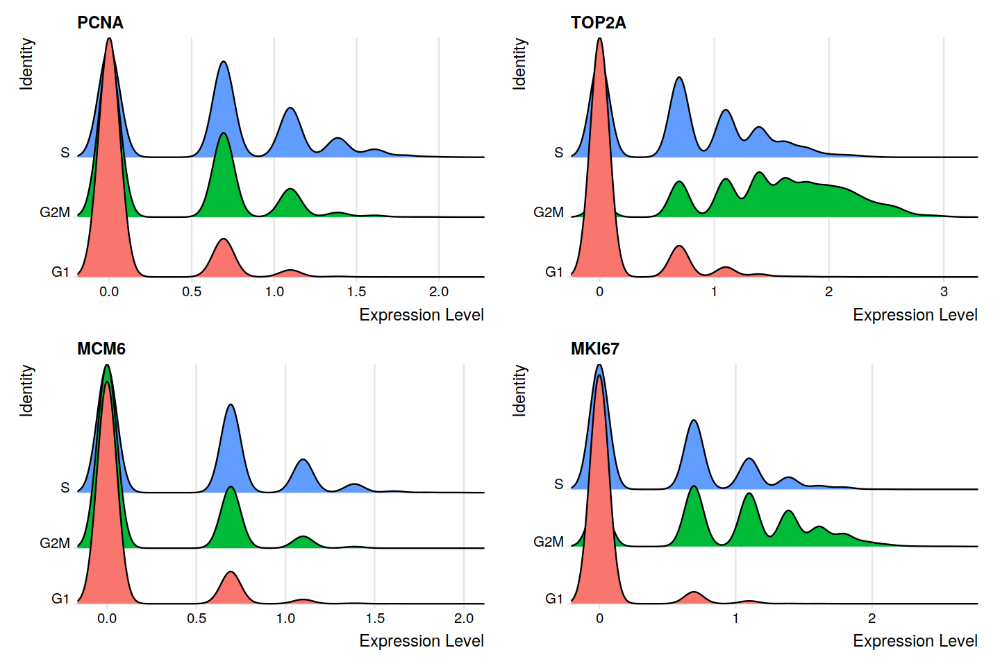

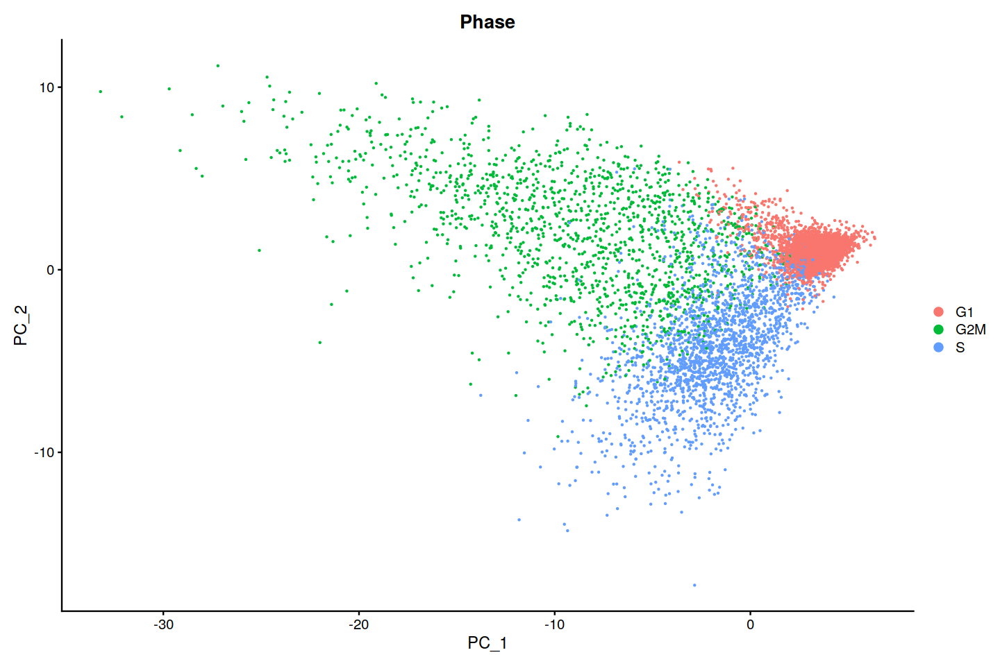

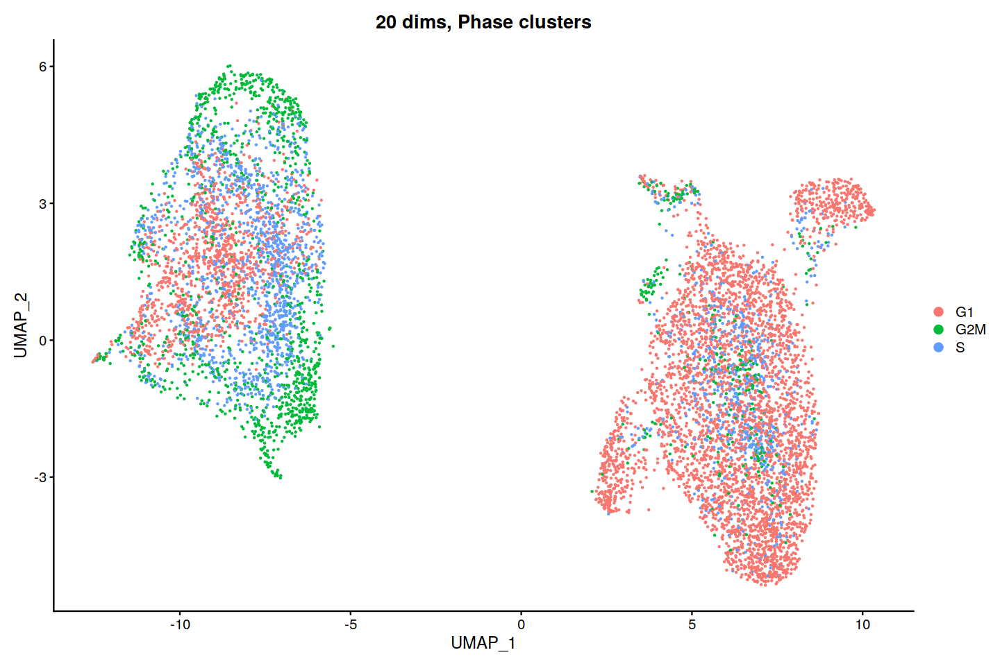

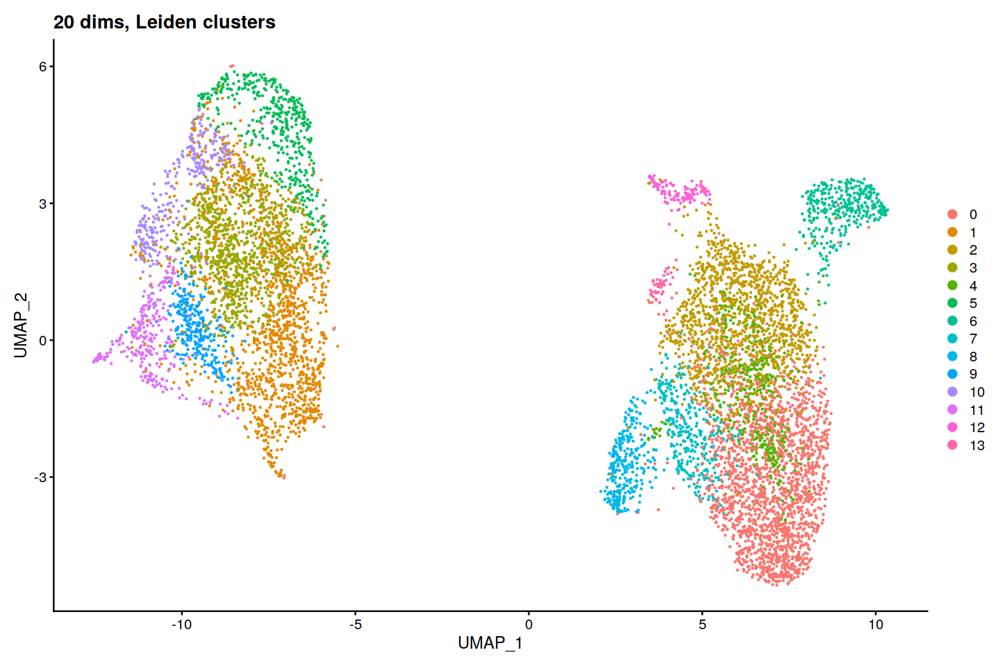

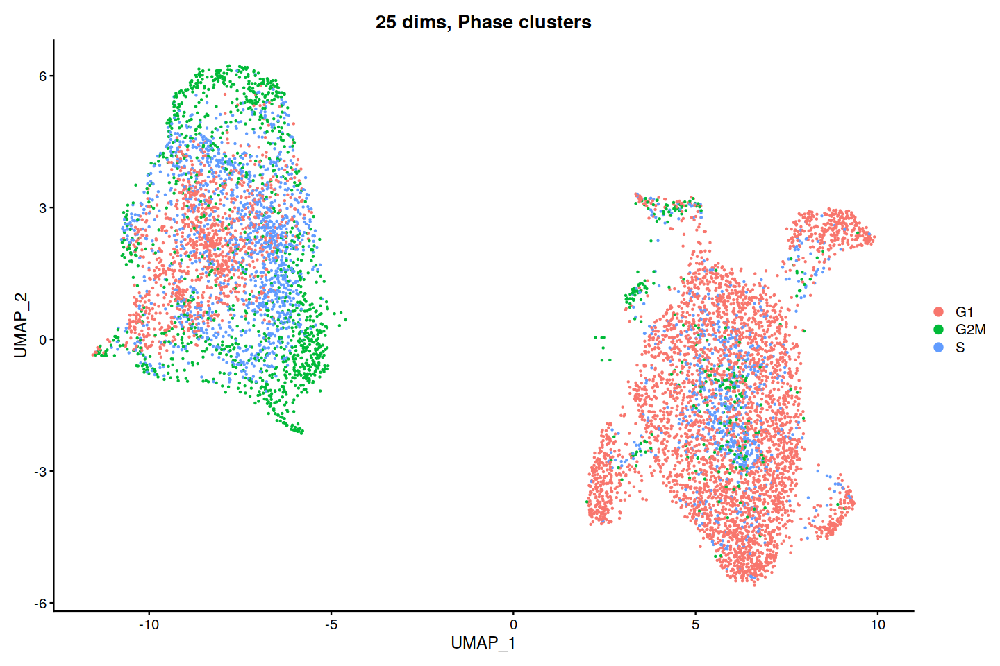

...

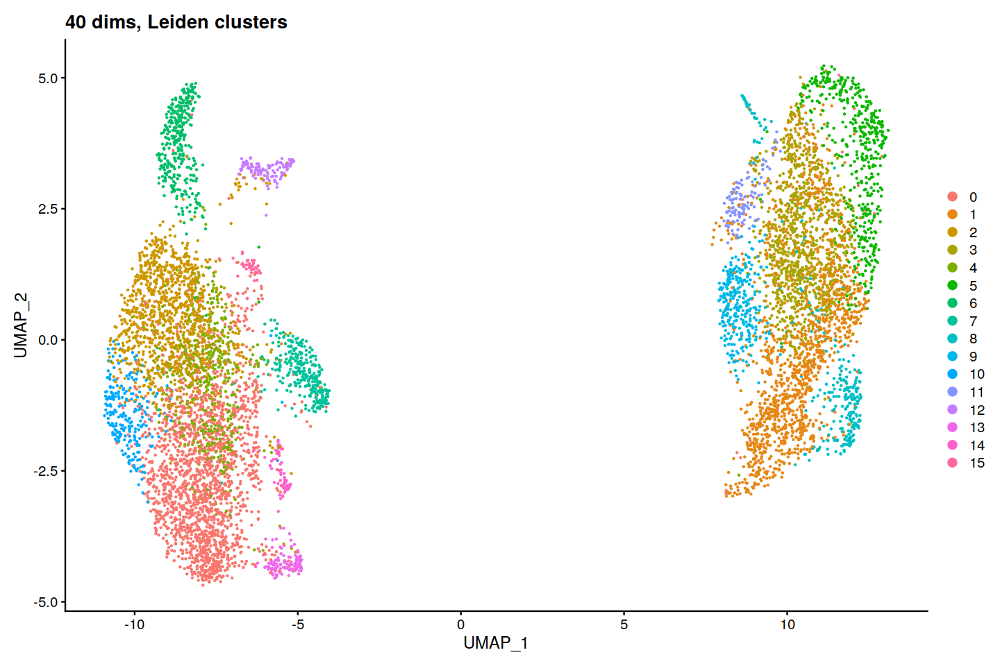

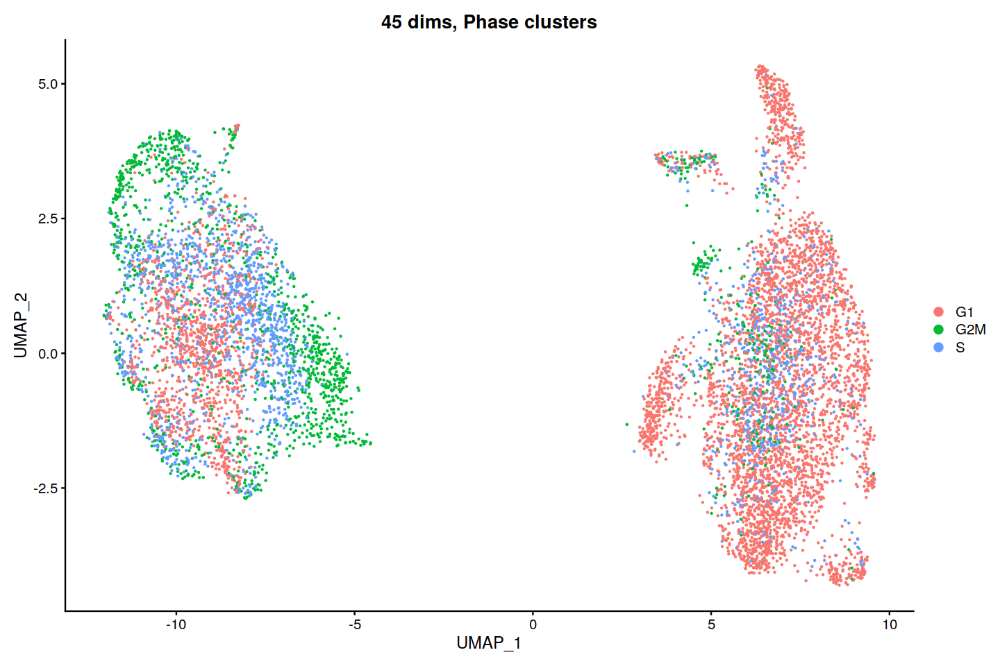

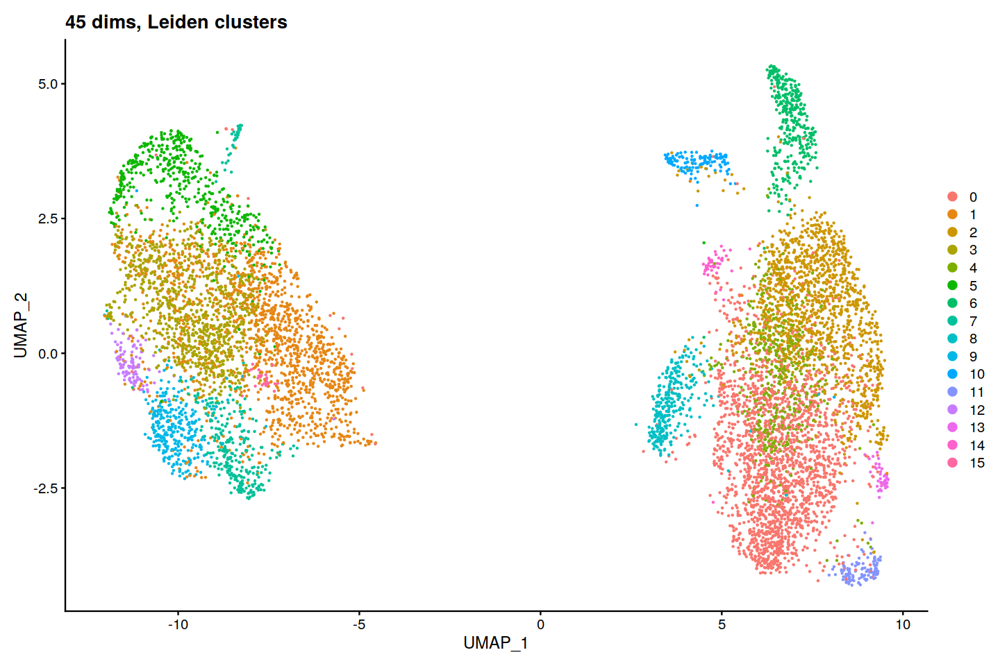

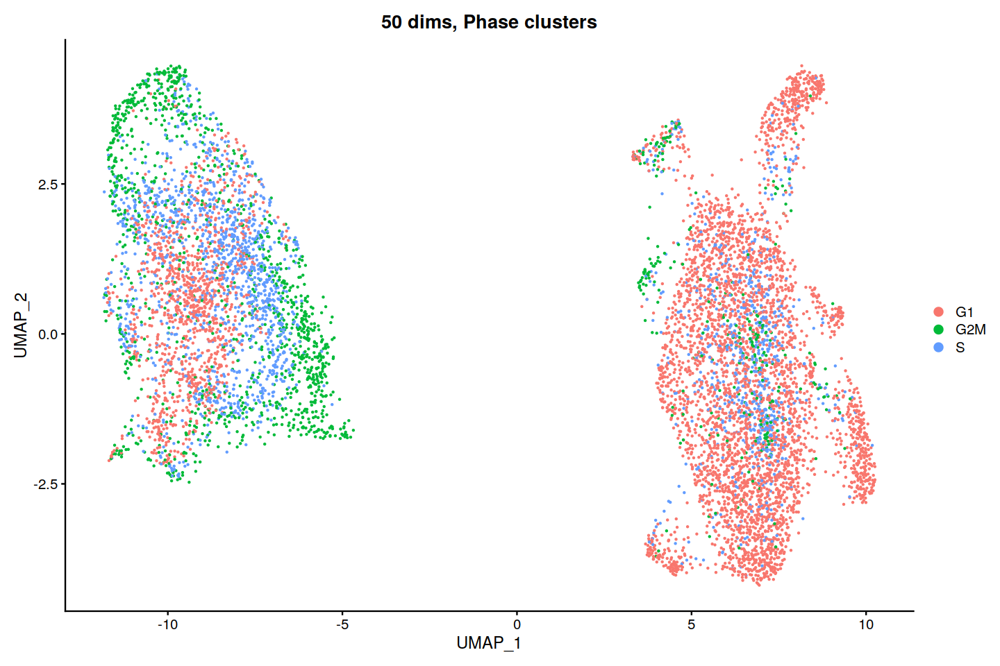

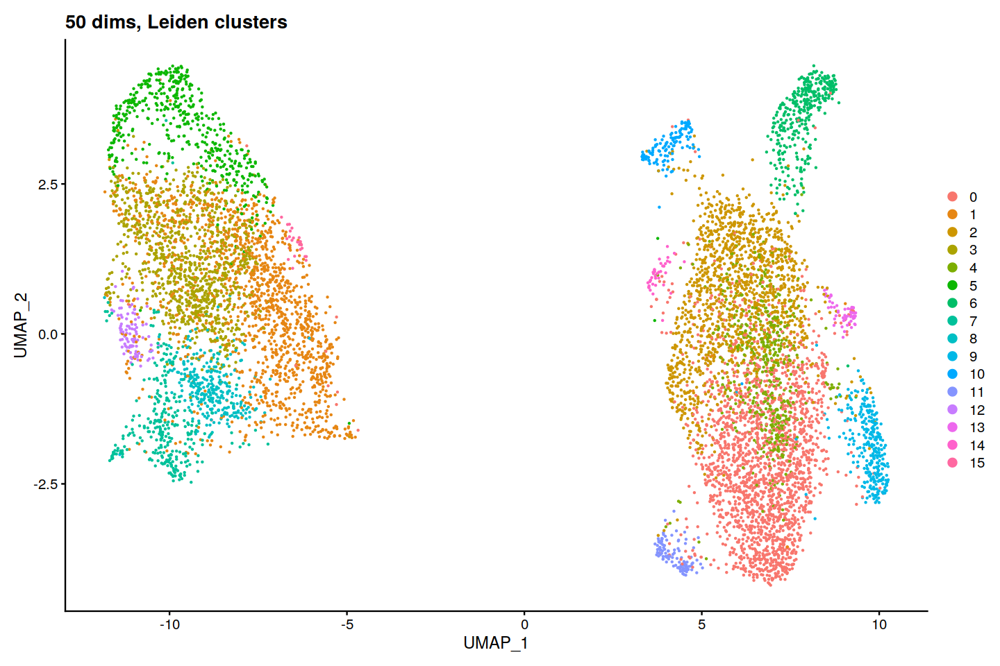

In [10]:
# regress cell cycle genes again since we combined the samples and test umap dims
combined_ms <- regress_cell_cycle_genes(combined_ms)

In [11]:
# run clustering with optimal number of clusters from previous cell
combined_ms <- umap_dim_test(combined_ms, return_obj = TRUE, return_dim = 45)

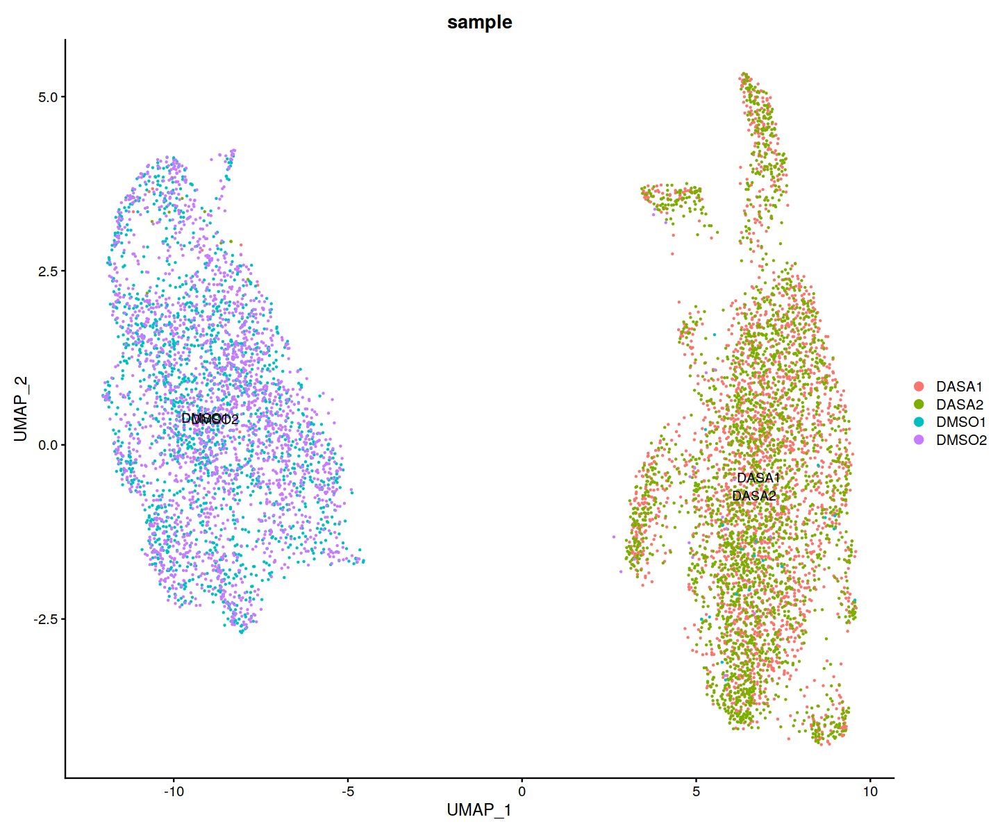

In [12]:
options(repr.plot.width = 12, repr.plot.height = 10)
DimPlot(combined_ms, label = TRUE, group.by = "sample", reduction = "umap")

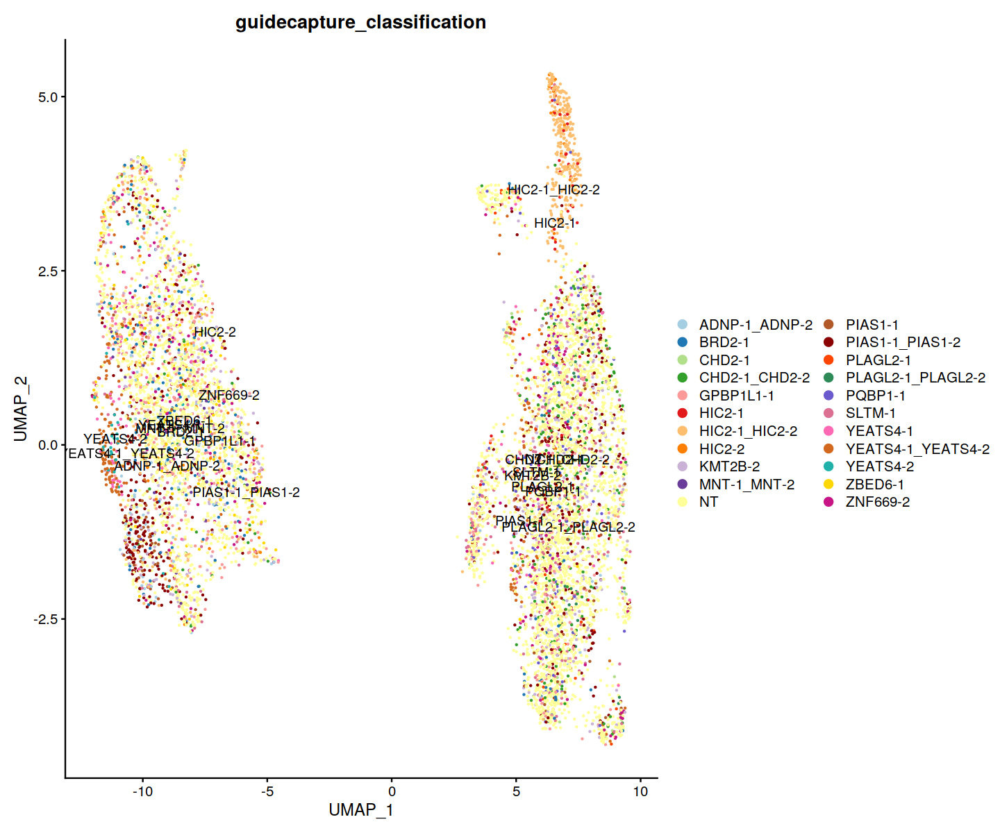

In [17]:
DimPlot(combined_ms, label = TRUE, group.by = "guidecapture_classification", reduction = "umap", cols = colors)

In [18]:
# add dmso vs dasa
combined_ms$treatment <-  unlist(lapply(combined_ms$sample, function(x) sub("^(.{4}).*", "\\1", x)))

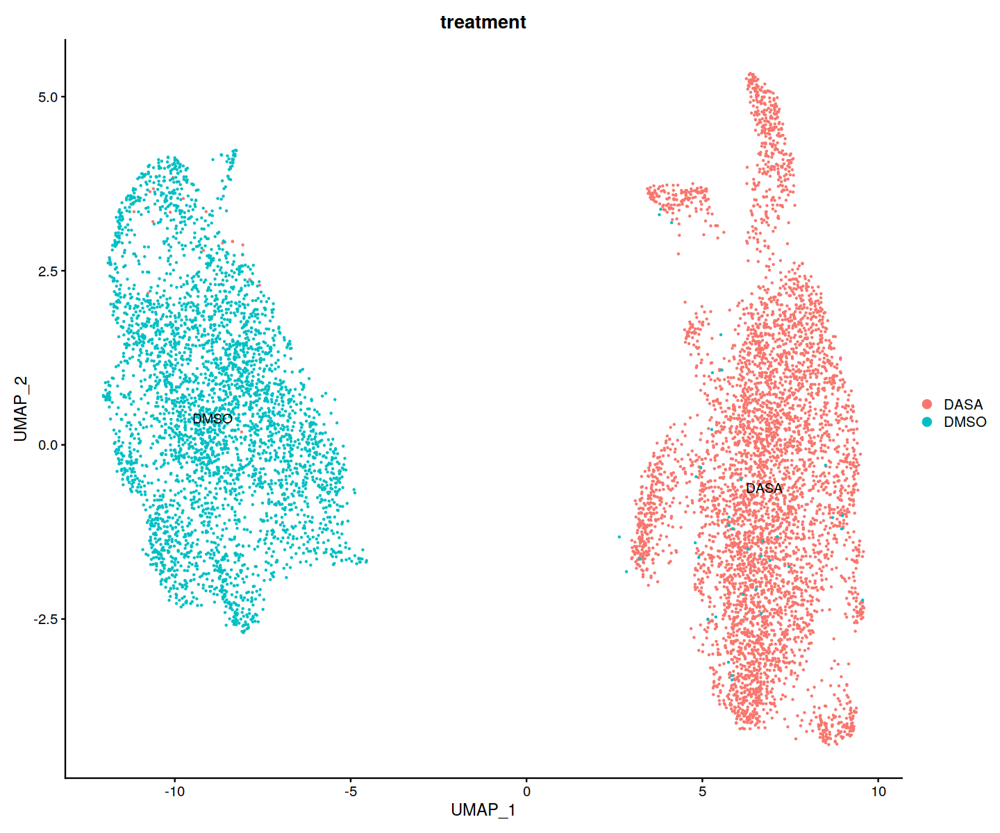

In [19]:
DimPlot(combined_ms, label=TRUE, group.by= "treatment", reduction="umap")

In [20]:
table(combined_ms$mixscape_class)


    ADNP-1_ADNP-2 KD            BRD2-1 KD            CHD2-1 KD 
                 119                  184                   52 
    CHD2-1_CHD2-2 KD         GPBP1L1-1 KD            HIC2-1 KD 
                 239                  387                   51 
    HIC2-1_HIC2-2 KD            HIC2-2 KD           KMT2B-2 KD 
                 506                   66                  384 
      MNT-1_MNT-2 KD                   NT           PIAS1-1 KD 
                  28                 4545                  142 
  PIAS1-1_PIAS1-2 KD          PLAGL2-1 KD PLAGL2-1_PLAGL2-2 KD 
                 505                   44                   43 
          PQBP1-1 KD            SLTM-1 KD          YEATS4-1 KD 
                 103                  361                  100 
YEATS4-1_YEATS4-2 KD          YEATS4-2 KD           ZBED6-1 KD 
                 235                   40                  139 
         ZNF669-2 KD 
                 209 

In [30]:
# save checkpoint
# saveRDS(combined_ms, "07_outputs_ngc/07_objects/07_combined_ms_checkpoint_1.rds")

In [6]:
# load checkpoint
# combined_ms <- readRDS("07_outputs_ngc/07_objects/07_combined_ms_checkpoint_1.rds")

In [21]:
combined_ms

An object of class Seurat 
345160 features across 8482 samples within 4 assays 
Active assay: SCT (22289 features, 3000 variable features)
 3 other assays present: ATAC, RNA, PRTB
 2 dimensional reductions calculated: pca, umap

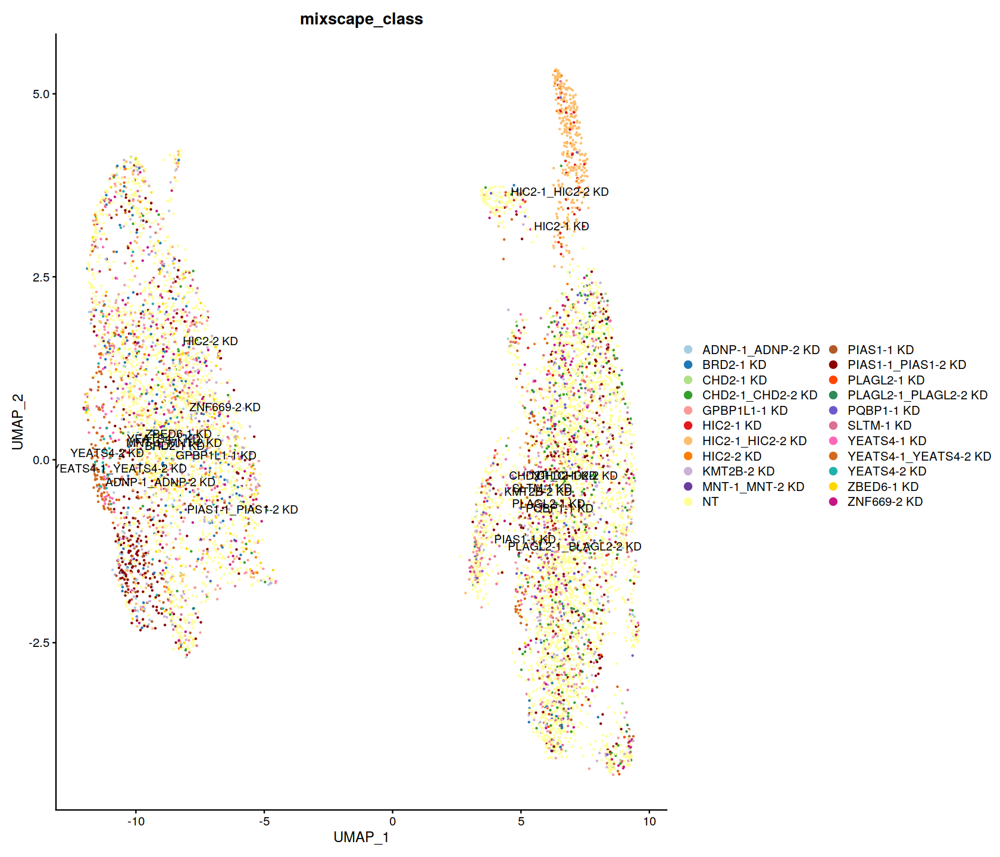

In [22]:
options(repr.plot.width = 14, repr.plot.height = 12)
library(RColorBrewer)
# colors <- brewer.pal(n = 12, name = "Set3")
# colors <- append(colors, c("darkgrey", "lightpink"), after = 8)
DimPlot(combined_ms, label=TRUE, group.by= "mixscape_class", 
        reduction="umap", cols = colors)

# RNA DEA

In [23]:
table(combined_ms$guidecapture_classification, useNA = "a")


    ADNP-1_ADNP-2            BRD2-1            CHD2-1     CHD2-1_CHD2-2 
              119               184                52               239 
        GPBP1L1-1            HIC2-1     HIC2-1_HIC2-2            HIC2-2 
              387                51               506                66 
          KMT2B-2       MNT-1_MNT-2                NT           PIAS1-1 
              384                28              4545               142 
  PIAS1-1_PIAS1-2          PLAGL2-1 PLAGL2-1_PLAGL2-2           PQBP1-1 
              505                44                43               103 
           SLTM-1          YEATS4-1 YEATS4-1_YEATS4-2          YEATS4-2 
              361               100               235                40 
          ZBED6-1          ZNF669-2              <NA> 
              139               209                 0 

In [24]:
# Create a new column based on the values in "treatment" and "guidecapture_classfication"
combined_ms$treatment_and_guidecapture <- paste(combined_ms$treatment, 
                                                                   sub("-.*", "", combined_ms$guidecapture_classification), 
                                                                   sep = "_")

In [25]:
table(combined_ms$treatment_and_guidecapture)


   DASA_ADNP    DASA_BRD2    DASA_CHD2 DASA_GPBP1L1    DASA_HIC2   DASA_KMT2B 
          15           34          237          146          401          221 
     DASA_NT   DASA_PIAS1  DASA_PLAGL2   DASA_PQBP1    DASA_SLTM  DASA_YEATS4 
        2793          327           87          103          242          125 
 DASA_ZNF669    DMSO_ADNP    DMSO_BRD2    DMSO_CHD2 DMSO_GPBP1L1    DMSO_HIC2 
          84          104          150           54          241          222 
  DMSO_KMT2B     DMSO_MNT      DMSO_NT   DMSO_PIAS1    DMSO_SLTM  DMSO_YEATS4 
         163           28         1752          320          119          250 
  DMSO_ZBED6  DMSO_ZNF669 
         139          125 

In [28]:
# set the idents so we can perform DEA
Idents(object = combined_ms) <- combined_ms$treatment_and_guidecapture

In [31]:
# DMSO vs DASA NT markersNT.de.markers <- FindMarkers(combined_ms, ident.1 = "DASA_NT", ident.2 = "DMSO_NT",                              only.pos = F, logfc.threshold = 1, test.use = "wilcox", min.pct = 0.5)dim(NT.de.markers)# view resultshead(NT.de.markers)# Sort the dataframe by a log2FC in descending orderNT.de.markers <- NT.de.markers[order(NT.de.markers$avg_log2FC, decreasing = TRUE), ]write.csv(NT.de.markers, file = '{PATH_1}')head(NT.de.markers, 20)

[1] 102   5

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENO1,0,-1.423533,0.406,0.946,0
ERMAP,0,1.168786,0.839,0.328,0
NPL,0,1.177582,0.874,0.445,0
CR1L,0,2.049746,0.981,0.459,0
SLC30A10,0,1.227205,0.708,0.126,0
SMYD3,0,-1.436383,0.921,0.980,0


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HBZ,0,5.141196,1.000,0.555,0
HBG2,0,3.765206,1.000,0.866,0
HBG1,0,2.773844,0.997,0.664,0
SLC25A37,0,2.733092,1.000,0.842,0
PTH2R,0,2.516123,0.996,0.523,0
GYPB,0,2.490677,1.000,0.896,0
APOE,0,2.340496,1.000,0.978,0
BLVRB,0,2.322901,0.986,0.282,0
CR1L,0,2.049746,0.981,0.459,0


In [34]:
# DMSO vs DASA HIC2 markersHIC2.de.markers <- FindMarkers(combined_ms, ident.1 = "DASA_HIC2", ident.2 = "DMSO_HIC2",                              only.pos = F, logfc.threshold = 1, test.use = "wilcox", min.pct = 0.5)dim(HIC2.de.markers)# view resultshead(HIC2.de.markers)# Sort the dataframe by a log2FC in descending orderHIC2.de.markers <- HIC2.de.markers[order(HIC2.de.markers$avg_log2FC, decreasing = TRUE), ]write.csv(HIC2.de.markers, file = '{PATH_2}')head(HIC2.de.markers, 20)

[1] 92  5

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HBZ,4.201684e-95,4.600747,1.000,0.829,9.365133e-91
HBG2,1.213541e-94,3.069305,1.000,0.995,2.704863e-90
GYPB,8.375370e-93,2.411607,1.000,0.928,1.866786e-88
SLC25A37,3.270534e-90,2.352900,1.000,0.928,7.289693e-86
HBG1,1.087062e-89,2.317307,1.000,0.950,2.422951e-85
BLVRB,5.250772e-88,2.167647,0.998,0.563,1.170345e-83


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HBZ,4.201684e-95,4.600747,1.000,0.829,9.365133e-91
HBG2,1.213541e-94,3.069305,1.000,0.995,2.704863e-90
AC079804.3,3.883330e-81,2.455392,0.963,0.306,8.655555e-77
HBA1,4.597139e-83,2.444359,0.978,0.405,1.024656e-78
GYPB,8.375370e-93,2.411607,1.000,0.928,1.866786e-88
SLC25A37,3.270534e-90,2.352900,1.000,0.928,7.289693e-86
HBG1,1.087062e-89,2.317307,1.000,0.950,2.422951e-85
CR1L,2.507951e-82,2.224279,0.998,0.617,5.589973e-78
BLVRB,5.250772e-88,2.167647,0.998,0.563,1.170345e-83


In [35]:
# DMSO vs DASA PIAS1 markersPIAS1.de.markers <- FindMarkers(combined_ms, ident.1 = "DASA_PIAS1", ident.2 = "DMSO_PIAS1",                              only.pos = F, logfc.threshold = 1, test.use = "wilcox", min.pct = 0.5)dim(PIAS1.de.markers)# view resultshead(PIAS1.de.markers)# Sort the dataframe by a log2FC in descending orderPIAS1.de.markers <- PIAS1.de.markers[order(PIAS1.de.markers$avg_log2FC, decreasing = TRUE), ]write.csv(PIAS1.de.markers, file = '{PATH_3}')head(PIAS1.de.markers, 20)

[1] 124   5

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ALAS2,1.170537e-111,2.220489,0.966,0.053,2.609010e-107
HBZ,1.814062e-109,5.460401,1.000,0.466,4.043364e-105
GYPB,4.848464e-107,3.091757,1.000,0.759,1.080674e-102
HBG2,5.122301e-107,3.970181,1.000,0.875,1.141710e-102
BLVRB,1.243767e-105,2.391181,0.994,0.300,2.772232e-101
SLC25A37,1.929856e-105,3.127165,0.997,0.828,4.301455e-101


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HBZ,1.814062e-109,5.460401,1.000,0.466,4.043364e-105
HBG2,5.122301e-107,3.970181,1.000,0.875,1.141710e-102
SLC25A37,1.929856e-105,3.127165,0.997,0.828,4.301455e-101
GYPB,4.848464e-107,3.091757,1.000,0.759,1.080674e-102
HBG1,1.184714e-103,3.040891,0.997,0.625,2.640609e-99
APOE,1.353437e-104,2.766972,1.000,0.978,3.016675e-100
PTH2R,1.331512e-96,2.444444,0.997,0.544,2.967806e-92
BLVRB,1.243767e-105,2.391181,0.994,0.300,2.772232e-101
CR1L,6.719061e-97,2.271564,0.988,0.403,1.497611e-92


In [36]:
# DASA HIC2 vs DASA NTDASA.HIC2.NT.de.markers <- FindMarkers(combined_ms, ident.1 = "DASA_HIC2", ident.2 = "DASA_NT",                              only.pos = F, test.use = "wilcox")dim(DASA.HIC2.NT.de.markers)# view resultshead(DASA.HIC2.NT.de.markers)# Sort the dataframe by a log2FC in descending orderDASA.HIC2.NT.de.markers <- DASA.HIC2.NT.de.markers[order(DASA.HIC2.NT.de.markers$avg_log2FC, decreasing = TRUE), ]write.csv(DASA.HIC2.NT.de.markers, file = '{PATH_4}')head(DASA.HIC2.NT.de.markers, 20)

[1] 293   5

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CTSE,0.000000e+00,1.0822441,0.546,0.005,0.000000e+00
STAR,2.297813e-155,0.8974807,0.494,0.058,5.121594e-151
HBG2,3.846958e-137,1.0341284,1.000,1.000,8.574484e-133
AC007563.2,5.308738e-134,0.5839419,0.339,0.023,1.183265e-129
ZFPM2,1.729989e-122,-1.2746313,0.823,0.990,3.855973e-118
ABCB9,4.741596e-115,0.7924573,0.454,0.071,1.056854e-110


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HBA1,6.179477e-114,1.3735160,0.978,0.784,1.377344e-109
MGST3,2.636843e-99,1.1677155,0.815,0.409,5.877259e-95
PRDX2,2.151090e-104,1.1294963,0.970,0.769,4.794565e-100
AMMECR1,7.473797e-91,1.1196851,0.778,0.387,1.665835e-86
CTSE,0.000000e+00,1.0822441,0.546,0.005,0.000000e+00
HBG2,3.846958e-137,1.0341284,1.000,1.000,8.574484e-133
TMEM14B,4.987542e-115,0.9800129,0.988,0.939,1.111673e-110
HBG1,2.520832e-110,0.9639117,1.000,0.997,5.618682e-106
TMEM14C,1.867838e-90,0.9080709,0.993,0.940,4.163223e-86


In [37]:
# DASA PIAS1 vs DASA NTDASA.PIAS1.NT.de.markers <- FindMarkers(combined_ms, ident.1 = "DASA_PIAS1", ident.2 = "DASA_NT",                              only.pos = F, test.use = "wilcox")dim(DASA.PIAS1.NT.de.markers)# view resultshead(DASA.PIAS1.NT.de.markers)# Sort the dataframe by a log2FC in descending orderDASA.PIAS1.NT.de.markers <- DASA.PIAS1.NT.de.markers[order(DASA.PIAS1.NT.de.markers$avg_log2FC, decreasing = TRUE), ]write.csv(DASA.PIAS1.NT.de.markers, file = '{PATH_5}')head(DASA.PIAS1.NT.de.markers, 20)

[1] 45  5

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PIAS1,1.538976e-113,-1.3824572,0.083,0.791,3.430223e-109
AC079801.1,7.435635e-67,0.7634252,0.997,0.956,1.657329e-62
MS4A3,1.818270e-46,0.7660858,0.927,0.740,4.052741e-42
AC079466.1,4.780192e-35,0.7400098,0.960,0.922,1.065457e-30
SH3GL3,2.329493e-33,0.5037378,0.431,0.161,5.192207e-29
TRIM24,6.222054e-28,0.5774577,0.820,0.646,1.386834e-23


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MS4A3,1.818270e-46,0.7660858,0.927,0.740,4.052741e-42
MS4A4A,1.221155e-18,0.7648745,0.664,0.453,2.721833e-14
AC079801.1,7.435635e-67,0.7634252,0.997,0.956,1.657329e-62
AC079466.1,4.780192e-35,0.7400098,0.960,0.922,1.065457e-30
TRIM24,6.222054e-28,0.5774577,0.820,0.646,1.386834e-23
TFPI,1.204927e-16,0.5276070,0.590,0.398,2.685662e-12
IGFL2-AS1,1.193138e-21,0.5067254,0.541,0.299,2.659386e-17
SH3GL3,2.329493e-33,0.5037378,0.431,0.161,5.192207e-29
SQLE,9.515211e-14,0.4652972,0.881,0.817,2.120845e-09


# ATAC DEA

In [38]:
# set default assay to ATAC
DefaultAssay(combined_ms) <- "ATAC"

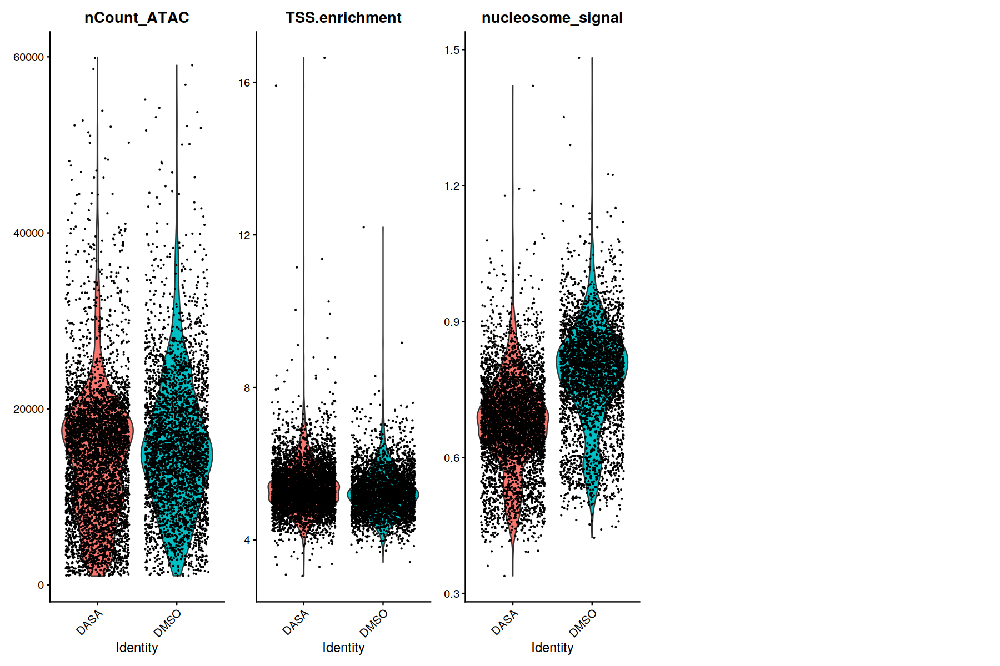

In [39]:
options(repr.plot.width = 15, repr.plot.height = 10)
Idents(combined_ms) <- "treatment"
VlnPlot(
  object = combined_ms,
  features = c('nCount_ATAC', 'TSS.enrichment', 'nucleosome_signal'),
  pt.size = 0.1,
  ncol = 5
)

In [40]:
# filter outliers
# look into blacklist_ratio and pct_reads_in_peaks as additional filters
combined_ms <- subset(
  x = combined_ms,
  subset = nCount_ATAC > 3000 &
    nCount_ATAC < 40000 &
    nucleosome_signal < 1 &
    TSS.enrichment > 3.5 &
    TSS.enrichment < 7.5
)
combined_ms

An object of class Seurat 
345160 features across 7994 samples within 4 assays 
Active assay: ATAC (279098 features, 0 variable features)
 3 other assays present: SCT, RNA, PRTB
 2 dimensional reductions calculated: pca, umap

In [41]:
# normalization and LDR
combined_ms <- RunTFIDF(combined_ms)
combined_ms <- FindTopFeatures(combined_ms, min.cutoff = 'q0')
combined_ms <- RunSVD(combined_ms)

Performing TF-IDF normalization



Warning message in RunTFIDF.default(object = GetAssayData(object = object, slot = "counts"), :
“Some features contain 0 total counts”
Running SVD

Scaling cell embeddings



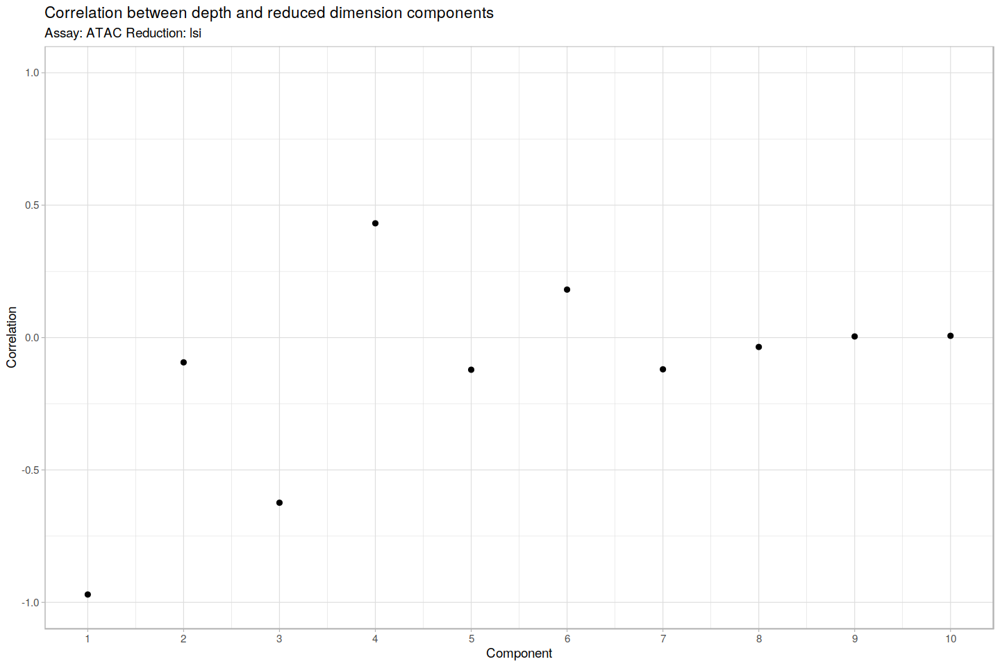

In [42]:
options(repr.plot.width = 12, repr.plot.height = 8)
DepthCor(combined_ms)

14:34:10 UMAP embedding parameters a = 0.9922 b = 1.112

14:34:10 Read 7994 rows and found 29 numeric columns

14:34:10 Using Annoy for neighbor search, n_neighbors = 30

14:34:10 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:34:11 Writing NN index file to temp file /tmp/Rtmp7ZnOoh/file36bc075644ecb2

14:34:11 Searching Annoy index using 1 thread, search_k = 3000

14:34:13 Annoy recall = 100%

14:34:14 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

14:34:17 Initializing from normalized Laplacian + noise (using irlba)

14:34:17 Commencing optimization for 500 epochs, with 322198 positive edges

14:34:27 Optimization finished

Computing nearest neighbor graph

Computing SNN



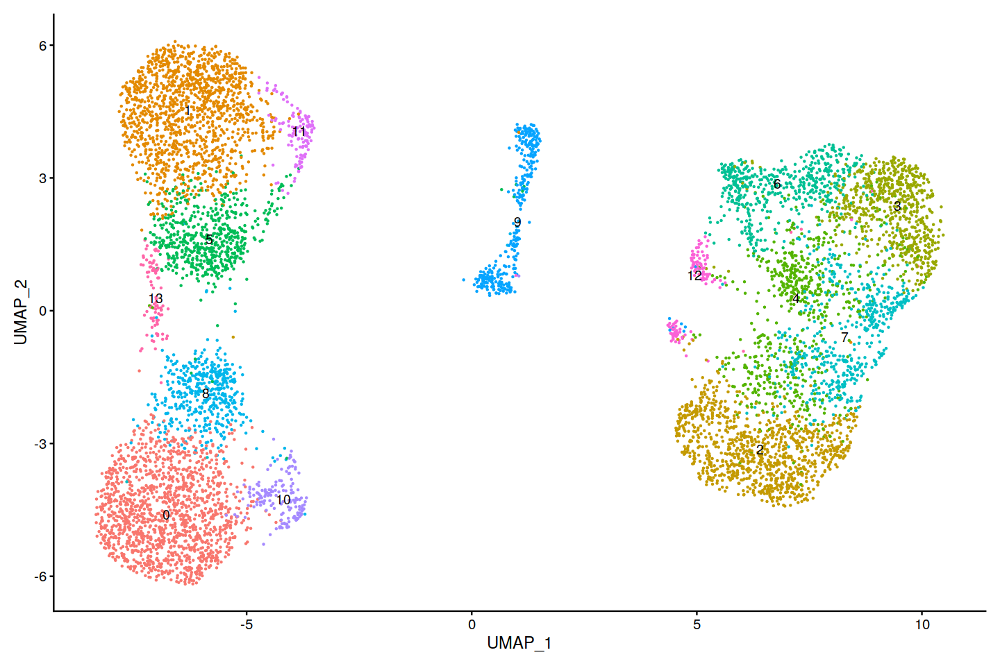

In [43]:
combined_ms <- RunUMAP(object = combined_ms, reduction = 'lsi', dims = 2:30)
combined_ms <- FindNeighbors(object = combined_ms, reduction = 'lsi', dims = 2:30)
combined_ms <- FindClusters(object = combined_ms, verbose = FALSE, algorithm = 3)
DimPlot(object = combined_ms, label = TRUE) + NoLegend()

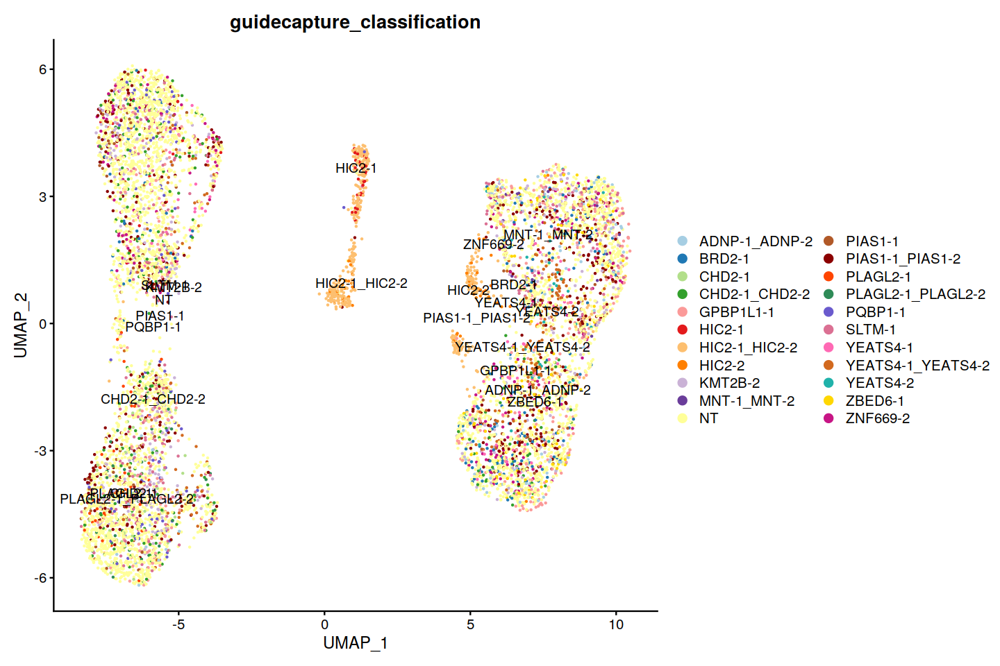

In [48]:
# umap computed with ATAC data and colored by guidecapture classification
DimPlot(object = combined_ms, label = TRUE, group.by = "guidecapture_classification", reduction = "umap", cols = colors)

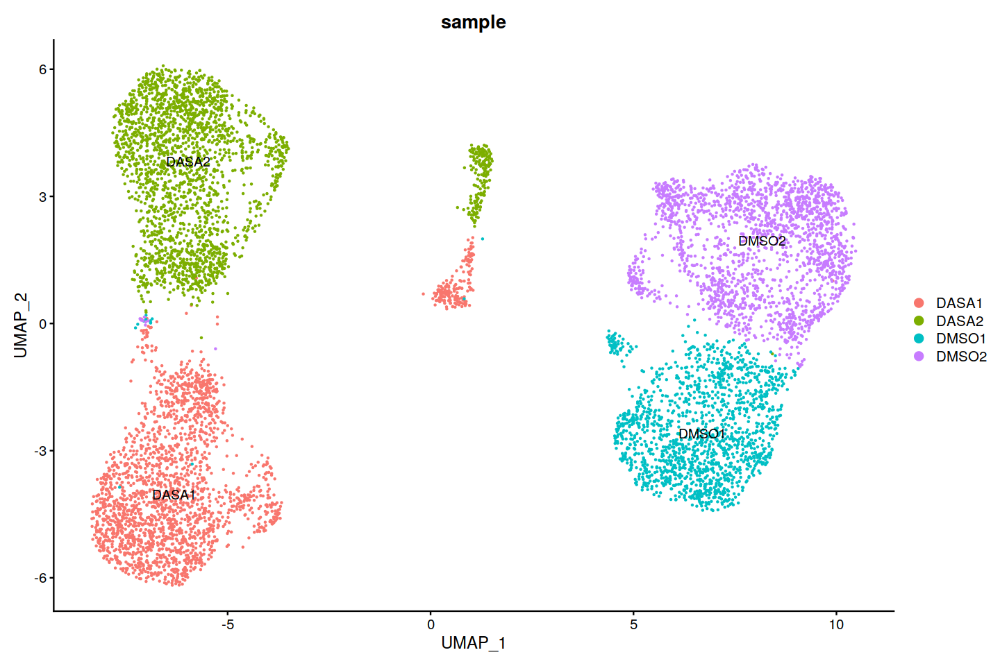

In [49]:
DimPlot(object = combined_ms, label = TRUE, group.by = "sample", reduction = "umap")

# Integrate ATAC Data
This step helps us remove our sample (DASA1, DASA2, DMSO1, DMSO2) batch effect.

In [50]:
# find integration anchors
integration.anchors <- FindIntegrationAnchors(
  object.list = list(subset(combined_ms, subset = sample == "DASA1"), 
                    subset(combined_ms, subset = sample == "DASA2"),
                    subset(combined_ms, subset = sample == "DMSO1"),
                    subset(combined_ms, subset = sample == "DMSO2")),
  anchor.features = rownames(combined_ms$SCT),
  reduction = "rlsi",
  dims = 2:50
)

Computing within dataset neighborhoods

Finding all pairwise anchors

Warning message:
“No filtering performed if passing to data rather than counts”
Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 3680 anchors

Warning message:
“No filtering performed if passing to data rather than counts”
Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1159 anchors

Warning message:
“No filtering performed if passing to data rather than counts”
Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1172 anchors

Warning message:
“No filtering performed if passing to data rather than counts”
Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1643 anchors

Warning message:
“No filtering performed if passing to data rather than counts”
Projecting new data onto SVD

Projecting new d

In [51]:
# integrate LSI embeddings
integrated <- IntegrateEmbeddings(
  anchorset = integration.anchors,
  reductions = combined_ms[["lsi"]],
  new.reduction.name = "integrated_lsi",
  dims.to.integrate = 1:50
)

# create a new UMAP using the integrated embeddings
integrated <- RunUMAP(integrated, reduction = "integrated_lsi", dims = 2:50, reduction.name = "atac.umap",
                     reduction.key = "atacUMAP_")

Merging dataset 1 into 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 2 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 3 into 2 1 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

14:43:48 UMAP embedding parameters a = 0.9922 b = 1.112

14:43:48 Read 7994 rows and found 49 numeric columns

14:43:48 Using Annoy for neighbor search, n_neighbors = 30

14:43:48 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:43:49 Writing NN index file to temp file /tmp/Rtmp7ZnOoh/file36bc073e4a1bc9

14:43:49 Searching An

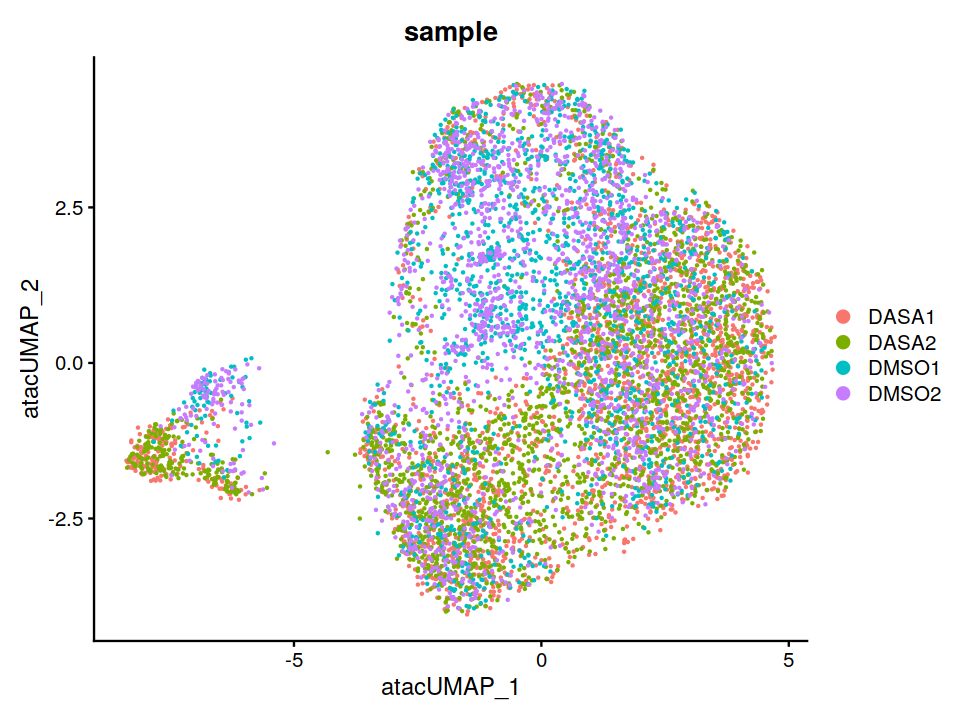

In [52]:
options(repr.plot.width = 8, repr.plot.height = 6)
p2 <- DimPlot(integrated, group.by = "sample")
p2

# ATAC DEA

### DASA VS DMSO NT

In [53]:
# set the idents so we can perform DEA
Idents(integrated) <- integrated$treatment_and_guidecapture
table(Idents(integrated))


     DASA_NT    DASA_HIC2   DASA_PIAS1    DASA_CHD2 DASA_GPBP1L1   DASA_PQBP1 
        2615          375          309          226          131          102 
  DASA_KMT2B    DASA_SLTM  DASA_PLAGL2  DASA_YEATS4    DASA_ADNP    DASA_BRD2 
         210          221           83          121           15           32 
 DASA_ZNF669   DMSO_KMT2B    DMSO_CHD2      DMSO_NT    DMSO_BRD2 DMSO_GPBP1L1 
          79          152           51         1661          148          222 
   DMSO_HIC2   DMSO_PIAS1   DMSO_ZBED6  DMSO_YEATS4  DMSO_ZNF669    DMSO_ADNP 
         216          299          126          241          121           98 
   DMSO_SLTM     DMSO_MNT 
         113           27 

In [54]:
# DASA vs DMSO NT ATAC DEda_atac_NT <- FindMarkers(  object = integrated,  ident.1 = "DASA_NT",  ident.2 = "DMSO_NT",  test.use = 'LR',  latent.vars = 'nCount_ATAC')head(da_atac_NT)dim(da_atac_NT)# Sort the dataframe by a log2FC in descending orderda_atac_NT <- da_atac_NT[order(da_atac_NT$avg_log2FC, decreasing = TRUE), ]write.csv(da_atac_NT, file = '{PATH_6}')head(da_atac_NT, 20)

Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr3-9397364-9397750,0.000000e+00,-12.56311,0.000,0.421,0.000000e+00
chr22-23269998-23270907,9.464431e-309,3.34398,0.586,0.084,2.641504e-303
chr22-19179529-19180097,6.139837e-289,-12.44642,0.000,0.365,1.713616e-283
chr22-19721910-19722685,4.221485e-275,-12.34735,0.000,0.352,1.178208e-269
chr12-53380417-53380875,1.000263e-238,12.24171,0.346,0.000,2.791714e-233
chr20-45971756-45972159,1.138410e-225,-12.28494,0.000,0.296,3.177279e-220


[1] 9311    5

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr12-53380417-53380875,1.000263e-238,12.24171,0.346,0,2.791714e-233
chr5-128083278-128084034,1.925339e-193,12.14723,0.289,0,5.373583e-188
chr9-128249287-128249901,3.823217e-199,12.08969,0.294,0,1.067052e-193
chr22-21946220-21946985,4.353999e-159,11.95602,0.241,0,1.215192e-153
chr11-95790303-95790595,8.006430e-147,11.89272,0.224,0,2.234579e-141
chr1-37689352-37690113,4.557634e-135,11.82506,0.208,0,1.272027e-129
chr6-32970009-32970736,7.319543e-121,11.78715,0.188,0,2.042870e-115
chr7-133080811-133081499,3.809938e-125,11.78152,0.195,0,1.063346e-119
chr22-19942527-19943324,6.602981e-117,11.76977,0.183,0,1.842879e-111


Warning message:
“Removed 14 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 131 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 78 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 86 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 41 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 164 rows containing missing values (`geom_segment()`).”


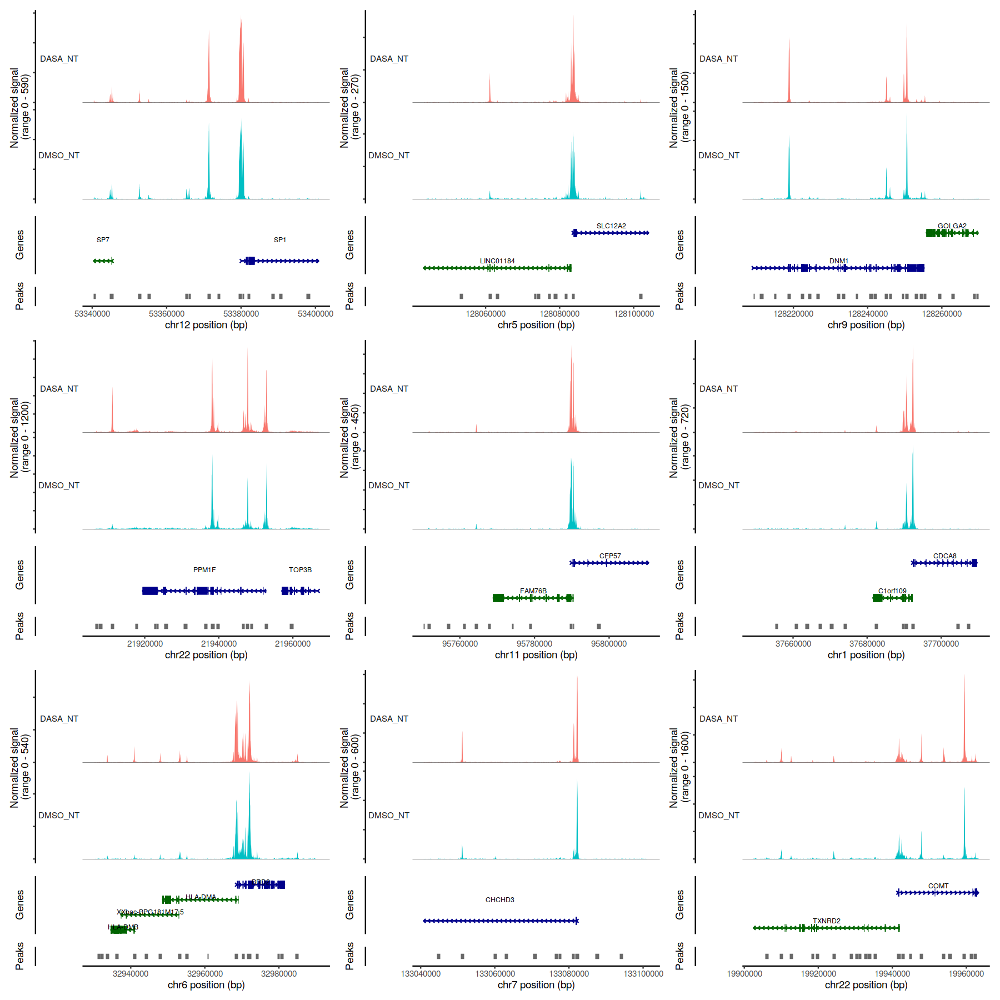

In [55]:
options(repr.plot.width = 15, repr.plot.height = 15)
CoveragePlot(
  object = subset(integrated, 
                  subset = treatment_and_guidecapture == "DASA_NT" | treatment_and_guidecapture == "DMSO_NT"),
    region = rownames(da_atac_NT)[1:9],
    extend.upstream = 40000,
    extend.downstream = 20000
)

### DASA VS DMSO HIC2

In [56]:
# DASA vs DMSO HIC2 ATAC DEda_atac_HIC2 <- FindMarkers(  object = integrated,  ident.1 = "DASA_HIC2",  ident.2 = "DMSO_HIC2",  test.use = 'LR',  latent.vars = 'nCount_ATAC')head(da_atac_HIC2)dim(da_atac_HIC2)# Sort the dataframe by a log2FC in descending orderda_atac_HIC2 <- da_atac_HIC2[order(da_atac_HIC2$avg_log2FC, decreasing = TRUE), ]write.csv(da_atac_HIC2, file = '{PATH_7}')head(da_atac_HIC2, 20)

Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr3-9397364-9397750,7.074101e-47,-12.51666,0.000,0.417,1.974367e-41
chr22-19721910-19722685,1.798386e-42,-12.53678,0.000,0.384,5.019259e-37
chr22-19179529-19180097,1.848805e-42,-12.39303,0.000,0.380,5.159979e-37
chr19-4066941-4067686,1.268406e-36,12.94116,0.379,0.000,3.540097e-31
chr9-128249287-128249901,1.454738e-33,12.36838,0.344,0.000,4.060144e-28
chr12-53380417-53380875,2.929488e-32,12.13997,0.323,0.000,8.176144e-27


[1] 12798     5

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr19-4066941-4067686,1.268406e-36,12.94116,0.379,0,3.540097e-31
chr3-178790058-178790970,5.459261e-15,12.67178,0.160,0,1.523669e-09
chr2-239115028-239115942,3.113829e-14,12.60980,0.152,0,8.690636e-09
chr6-6891443-6892030,1.797651e-15,12.58877,0.165,0,5.017207e-10
chr3-13017845-13018699,1.336830e-16,12.58555,0.173,0,3.731065e-11
chr22-21753302-21753974,1.343041e-27,12.56652,0.288,0,3.748400e-22
chr1-37689352-37690113,1.422129e-27,12.47741,0.293,0,3.969134e-22
chr3-17227710-17228704,1.347134e-13,12.44797,0.144,0,3.759823e-08
chr4-44523996-44525063,5.105326e-12,12.41611,0.125,0,1.424886e-06


Warning message:
“Removed 13 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 36 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 82 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 44 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 219 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_segment()`).”


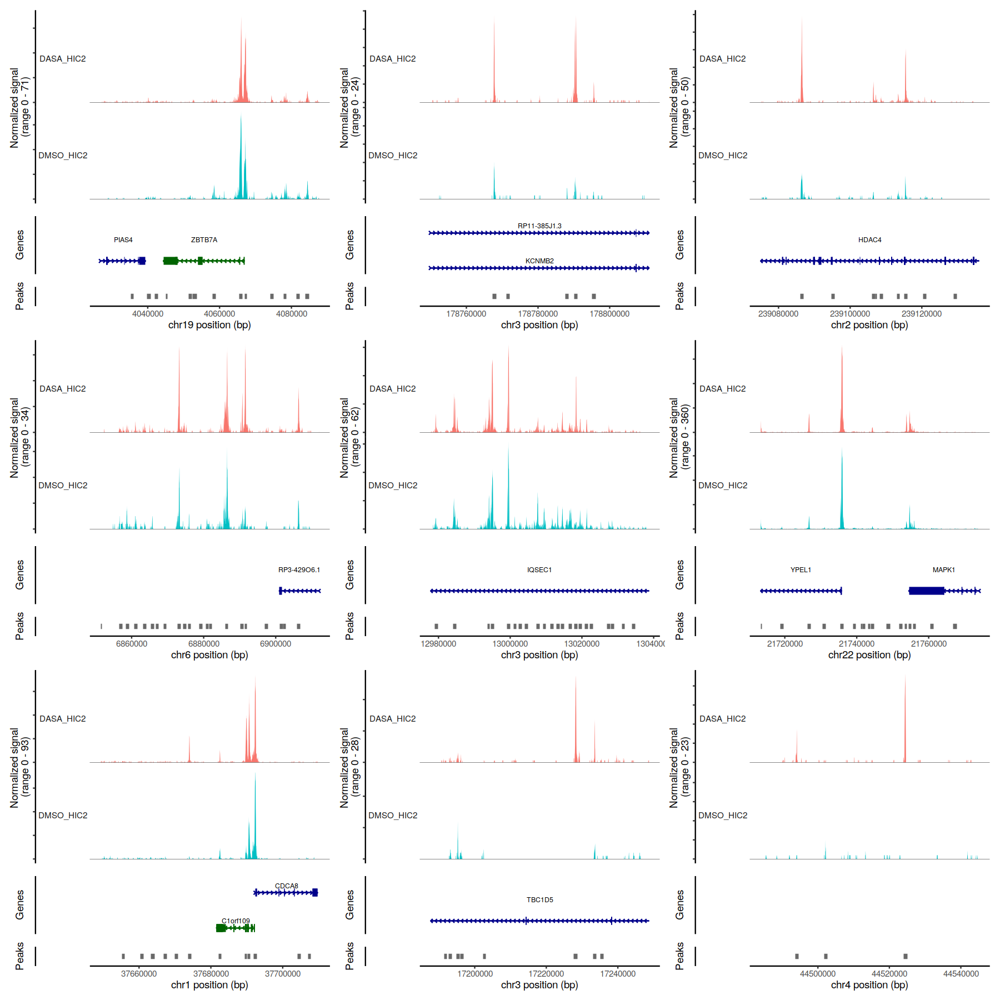

In [57]:
CoveragePlot(
  object = subset(integrated, 
                  subset = treatment_and_guidecapture == "DASA_HIC2" | treatment_and_guidecapture == "DMSO_HIC2"),
    region = rownames(da_atac_HIC2)[1:9],
    extend.upstream = 40000,
    extend.downstream = 20000
)

### DASA VS DMSO PIAS1

In [58]:
# DASA vs DMSO PIAS1 ATAC DEda_atac_PIAS1 <- FindMarkers(  object = integrated,  ident.1 = "DASA_PIAS1",  ident.2 = "DMSO_PIAS1",  test.use = 'LR',  latent.vars = 'nCount_ATAC')head(da_atac_PIAS1)dim(da_atac_PIAS1)# Sort the dataframe by a log2FC in descending orderda_atac_PIAS1 <- da_atac_PIAS1[order(da_atac_PIAS1$avg_log2FC, decreasing = TRUE), ]write.csv(da_atac_PIAS1, file = '{PATH_8}')head(da_atac_PIAS1, 20)

Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”
Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr3-9397364-9397750,5.584384e-48,-12.524848,0.000,0.421,1.558590e-42
chr22-23269998-23270907,8.587268e-48,4.294309,0.505,0.037,2.396689e-42
chr22-19721910-19722685,3.652329e-44,-12.644973,0.000,0.395,1.019358e-38
chr12-53380417-53380875,2.028226e-36,12.140223,0.320,0.000,5.660739e-31
chr22-19179529-19180097,2.294463e-33,-12.136388,0.000,0.308,6.403800e-28
chr9-128249287-128249901,9.520372e-31,12.071968,0.275,0.000,2.657117e-25


[1] 12206     5

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr7-133080811-133081499,8.609649e-29,12.21509,0.259,0,2.402936e-23
chr22-21946220-21946985,1.345632e-29,12.17047,0.262,0,3.755633e-24
chr4-102826493-102827319,1.338078e-22,12.15973,0.210,0,3.734550e-17
chr12-53380417-53380875,2.028226e-36,12.14022,0.320,0,5.660739e-31
chr9-128249287-128249901,9.520372e-31,12.07197,0.275,0,2.657117e-25
chr14-46021922-46022828,8.282574e-20,12.02020,0.178,0,2.311650e-14
chr5-128083278-128084034,9.340763e-30,11.96937,0.262,0,2.606988e-24
chr19-491537-491791,4.294526e-21,11.96124,0.191,0,1.198594e-15
chr20-2872472-2872980,2.188154e-21,11.94544,0.194,0,6.107095e-16


Warning message:
“Removed 41 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 78 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 3 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 14 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 131 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 40 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 129 rows containing missing values (`geom_segment()`).”


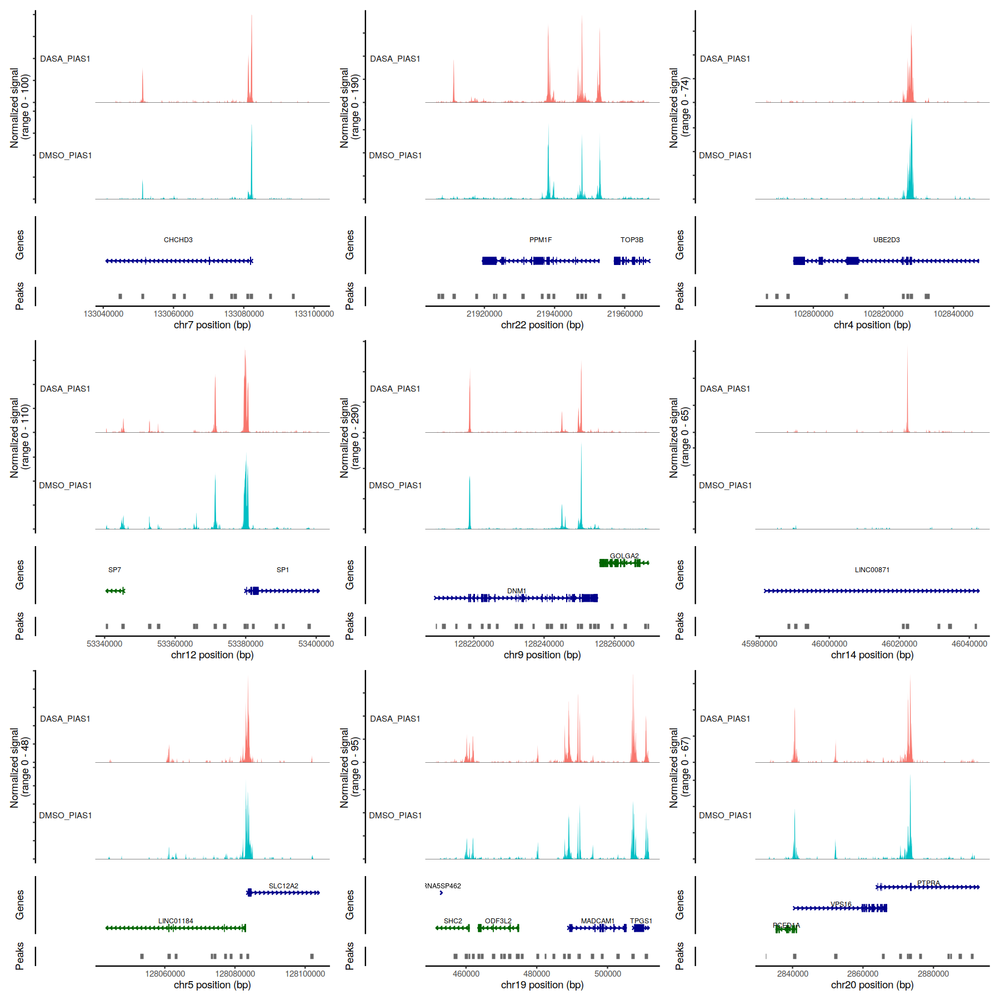

In [59]:
CoveragePlot(
  object = subset(integrated, 
                  subset = treatment_and_guidecapture == "DASA_PIAS1" | treatment_and_guidecapture == "DMSO_PIAS1"),
    region = rownames(da_atac_PIAS1)[1:9],
    extend.upstream = 40000,
    extend.downstream = 20000
)

### DASA HIC2 VS DASA NT

In [60]:
da_atac_DASA_HIC2_NT <- FindMarkers(  object = integrated,  ident.1 = "DASA_HIC2",  ident.2 = "DASA_NT",  test.use = 'LR',  latent.vars = 'nCount_ATAC')head(da_atac_DASA_HIC2_NT)dim(da_atac_DASA_HIC2_NT)# Sort the dataframe by a log2FC in descending orderda_atac_DASA_HIC2_NT <- da_atac_DASA_HIC2_NT[order(da_atac_DASA_HIC2_NT$avg_log2FC, decreasing = TRUE), ]write.csv(da_atac_DASA_HIC2_NT, file = '{PATH_9}')head(da_atac_DASA_HIC2_NT, 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr22-19933251-19934308,9.503700e-96,4.374050,0.363,0.021,2.652464e-90
chr22-23191892-23192845,1.889645e-85,2.870125,0.459,0.077,5.273960e-80
chr22-23176926-23177802,3.279474e-84,2.217832,0.576,0.167,9.152947e-79
chr22-29733698-29734558,1.084732e-67,4.647932,0.253,0.011,3.027466e-62
chr11-64598853-64599781,7.345023e-60,4.759039,0.221,0.009,2.049981e-54
chr7-47568307-47569258,9.652173e-56,3.552481,0.272,0.024,2.693902e-50


[1] 7145    5

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr4-168257537-168258490,4.623357e-53,5.596211,0.181,0.003,1.290370e-47
chr7-128116669-128117601,3.204012e-50,5.531988,0.168,0.004,8.942334e-45
chr3-10763876-10765358,1.545156e-41,5.493037,0.141,0.003,4.312499e-36
chr11-69264362-69265503,3.149171e-32,5.299103,0.115,0.003,8.789273e-27
chr10-69107390-69108284,9.910451e-29,5.068601,0.104,0.003,2.765987e-23
chr11-44916483-44917470,1.125400e-40,4.910012,0.147,0.006,3.140969e-35
chr1-94023830-94024744,6.312230e-43,4.810219,0.160,0.006,1.761731e-37
chr4-44523996-44525063,2.196134e-33,4.787492,0.125,0.005,6.129365e-28
chr11-64598853-64599781,7.345023e-60,4.759039,0.221,0.009,2.049981e-54


Warning message:
“Removed 20 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 72 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 52 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 90 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 23 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 139 rows containing missing values (`geom_segment()`).”


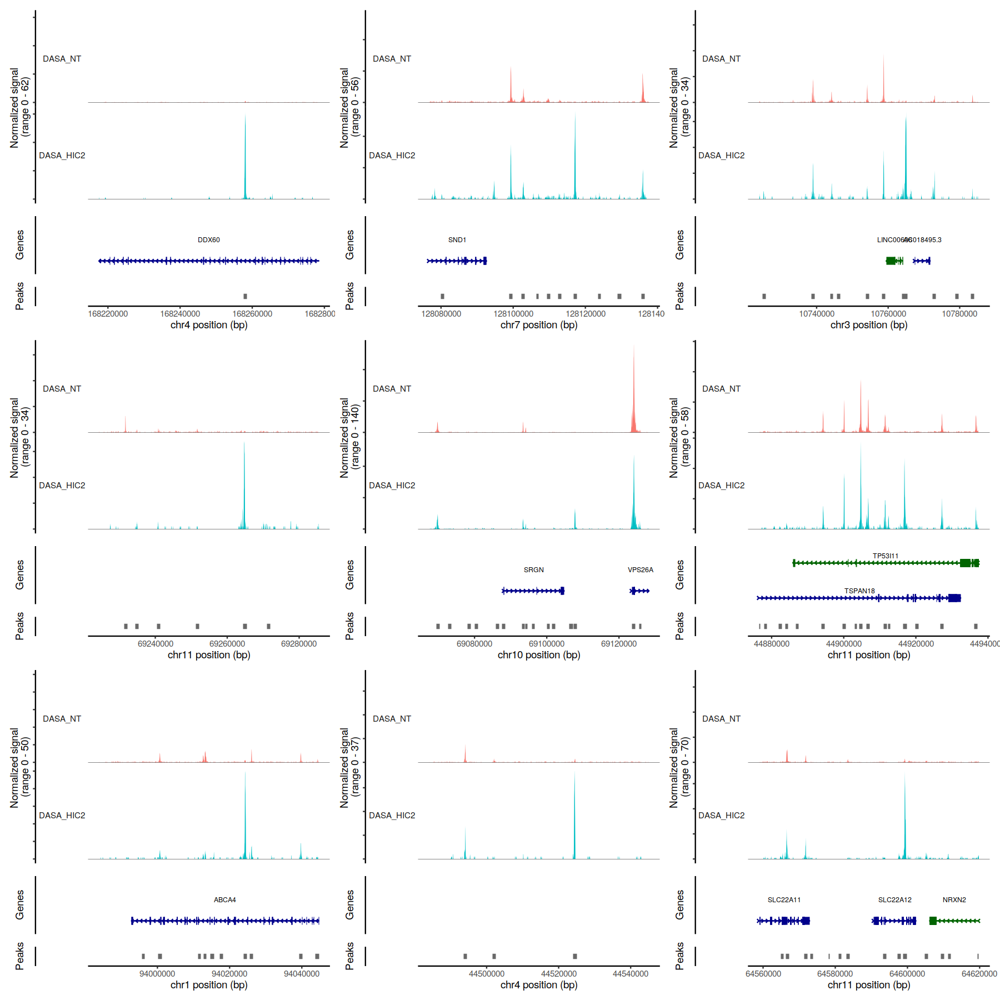

In [61]:
CoveragePlot(
  object = subset(integrated, 
                  subset = treatment_and_guidecapture == "DASA_HIC2" | treatment_and_guidecapture == "DASA_NT"),
    region = rownames(da_atac_DASA_HIC2_NT)[1:9],
    extend.upstream = 40000,
    extend.downstream = 20000
)

### DASA PIAS1 VS DASA NT

In [62]:
da_atac_DASA_PIAS1_NT <- FindMarkers(  object = integrated,  ident.1 = "DASA_PIAS1",  ident.2 = "DASA_NT",  test.use = 'LR',  latent.vars = 'nCount_ATAC')head(da_atac_DASA_PIAS1_NT)dim(da_atac_DASA_PIAS1_NT)# Sort the dataframe by a log2FC in descending orderda_atac_DASA_PIAS1_NT <- da_atac_DASA_PIAS1_NT[order(da_atac_DASA_PIAS1_NT$avg_log2FC, decreasing = TRUE), ]write.csv(da_atac_DASA_PIAS1_NT, file = '{PATH_10}')head(da_atac_DASA_PIAS1_NT, 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr8-125941827-125942776,9.123703e-17,2.805822,0.123,0.019,2.546407e-11
chr15-68053859-68054711,1.300720e-16,-1.994762,0.068,0.268,3.630284e-11
chr13-90526430-90527345,2.034002e-15,2.058207,0.168,0.042,5.676858e-10
chr1-186195133-186196059,5.693742e-13,1.643828,0.191,0.065,1.589112e-07
chr8-53492229-53493158,1.231910e-12,1.222323,0.275,0.129,3.438236e-07
chr4-152177269-152178211,2.541903e-12,1.745418,0.162,0.052,7.094399e-07


[1] 4790    5

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr8-125941827-125942776,9.123703e-17,2.805822,0.123,0.019,2.546407e-11
chr8-125986397-125987441,1.630849e-11,2.260617,0.107,0.023,4.551668e-06
chr5-43804480-43805401,3.622202e-10,2.109188,0.104,0.025,1.010949e-04
chr13-90526430-90527345,2.034002e-15,2.058207,0.168,0.042,5.676858e-10
chr3-174133354-174134265,8.552402e-10,2.054233,0.104,0.026,2.386958e-04
chr11-94077607-94078705,1.108567e-09,1.909836,0.110,0.031,3.093987e-04
chr4-152177269-152178211,2.541903e-12,1.745418,0.162,0.052,7.094399e-07
chr1-186195133-186196059,5.693742e-13,1.643828,0.191,0.065,1.589112e-07
chr13-112101278-112102146,3.611686e-09,1.637845,0.133,0.045,1.008014e-03


Warning message:
“Removed 9 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 38 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 115 rows containing missing values (`geom_segment()`).”


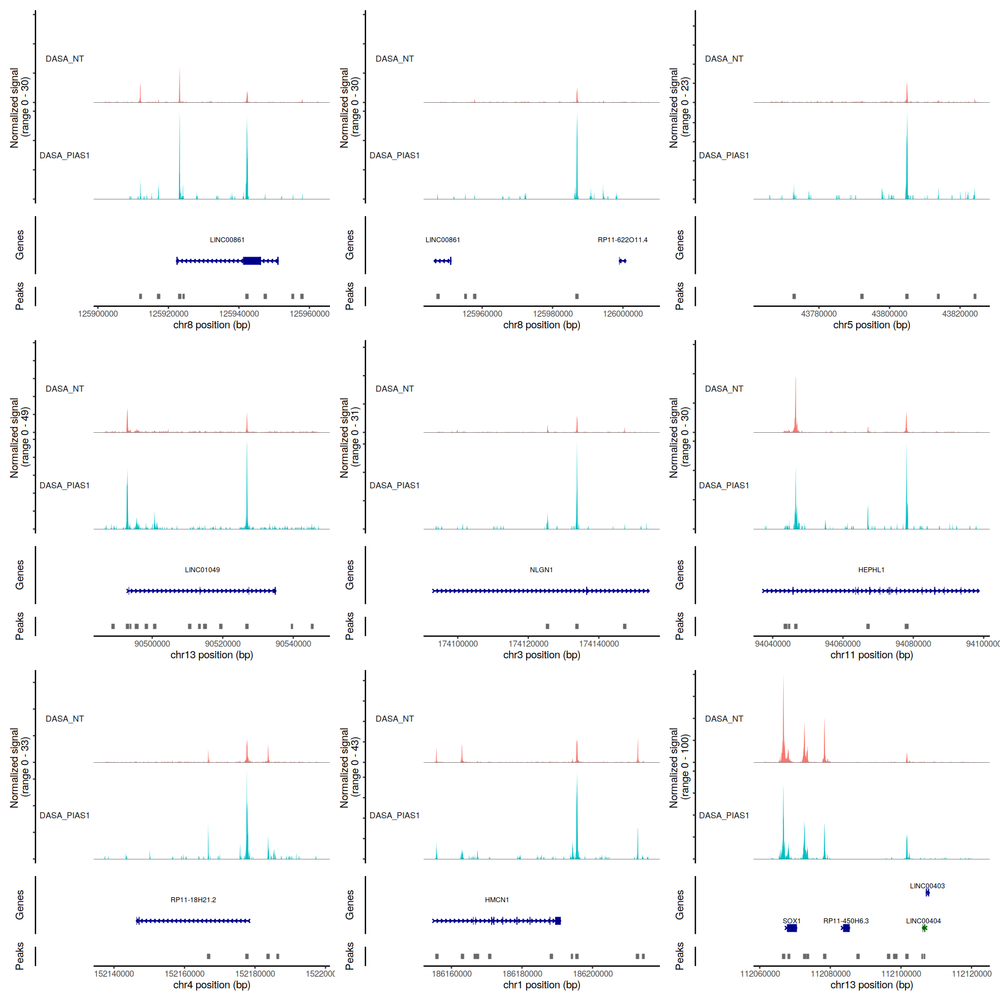

In [63]:
CoveragePlot(
  object = subset(integrated, 
                  subset = treatment_and_guidecapture == "DASA_PIAS1" | treatment_and_guidecapture == "DASA_NT"),
    region = rownames(da_atac_DASA_PIAS1_NT)[1:9],
    extend.upstream = 40000,
    extend.downstream = 20000
)

# Compute WNN UMAP

In [64]:
integrated

An object of class Seurat 
345160 features across 7994 samples within 4 assays 
Active assay: ATAC (279098 features, 0 variable features)
 3 other assays present: SCT, RNA, PRTB
 2 dimensional reductions calculated: integrated_lsi, atac.umap

To compute a wnn umap we need to recompute RNA umap.

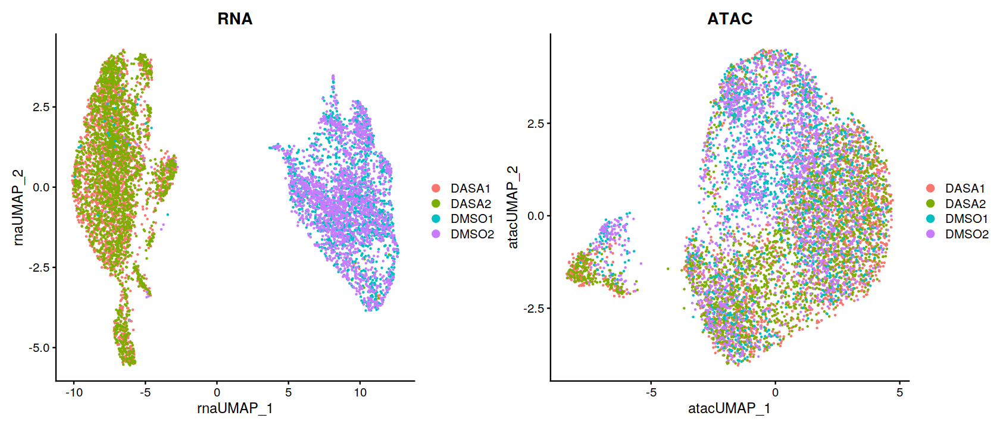

In [65]:
# recompute rna umap
DefaultAssay(integrated) <- "RNA"
integrated <- SCTransform(integrated, vars.to.regress = c("percent.mt", "S.Score", "G2M.Score"), verbose = FALSE)
integrated <- RunPCA(integrated, verbose = FALSE)
integrated <- RunUMAP(integrated, dims = 1:30, verbose = FALSE, 
                      reduction.name = "rna.umap", reduction.key = "rnaUMAP_")

integrated <- FindNeighbors(integrated, dims = 1:30, verbose = FALSE)
integrated <- FindClusters(integrated, verbose = FALSE)

options(repr.plot.width = 14, repr.plot.height = 6)
p1 <- DimPlot(integrated, reduction = "rna.umap", group.by = "sample") + ggtitle("RNA")
p2 <- DimPlot(integrated, reduction = "atac.umap", group.by = "sample") + ggtitle("ATAC")
p1+p2

In [66]:
# compute wnn umap
integrated <- FindMultiModalNeighbors(
  integrated, reduction.list = list("pca", "integrated_lsi"), 
  dims.list = list(1:30, 2:50))

Calculating cell-specific modality weights

Finding 20 nearest neighbors for each modality.



Calculating kernel bandwidths

Finding multimodal neighbors

Constructing multimodal KNN graph

Constructing multimodal SNN graph



In [67]:
integrated <- RunUMAP(integrated, nn.name = "weighted.nn", reduction.name = "wnn.umap", reduction.key = "wnnUMAP_")
integrated <- FindClusters(integrated, graph.name = "wsnn", algorithm = 3, verbose = FALSE)

15:05:03 UMAP embedding parameters a = 0.9922 b = 1.112



15:05:04 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 20

15:05:07 Initializing from normalized Laplacian + noise (using irlba)

15:05:07 Commencing optimization for 500 epochs, with 251420 positive edges

15:05:18 Optimization finished



In [68]:
p3 <- DimPlot(integrated, group.by = "sample", reduction = "wnn.umap") + ggtitle("wnn")

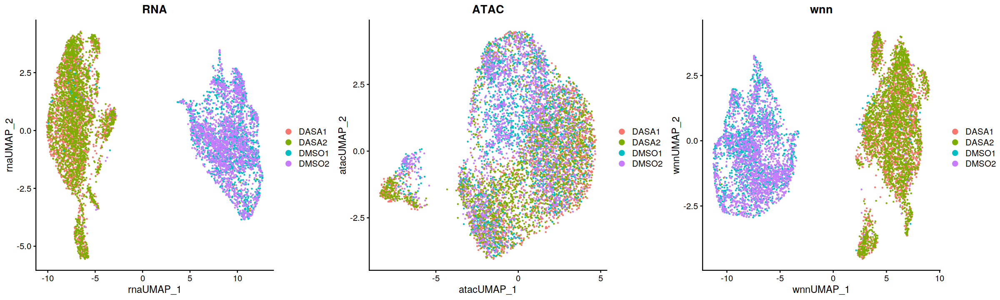

In [69]:
options(repr.plot.width = 20, repr.plot.height = 6)
grid.arrange(p1, p2, p3, nrow = 1, ncol = 3)

In [74]:
# Extend the list by adding more distinguishable colors
colors <- c(
    colors_brewer,
    "#8B0000",  # Dark Red
    "#FF4500",  # Orange Red
    "#2E8B57",  # Sea Green
    "#6A5ACD",  # Slate Blue
    "#DB7093",  # Pale Violet Red
    "#FF69B4",  # Hot Pink
    "#D2691E",  # Chocolate
    "#20B2AA",  # Light Sea Green
    "#FFD700",  # Gold
    "#C71585",  # Medium Violet Red
    "#00CED1",  # Dark Turquoise
    "#FFB6C1",  # Light Pink
    "#8A2BE2",  # Blue Violet
    "#7FFF00",  # Chartreuse
    "#D2B48C",  # Tan
    "#FA8072",  # Salmon
    "#F08080",  # Light Coral
    "#E9967A",  # Dark Salmon
    "#4682B4",  # Steel Blue
    "#9ACD32",  # Yellow Green
    "#40E0D0",  # Turquoise
    "#FF6347",  # Tomato
    "#4169E1",  # Royal Blue
    "#6B8E23"   # Olive Drab
)

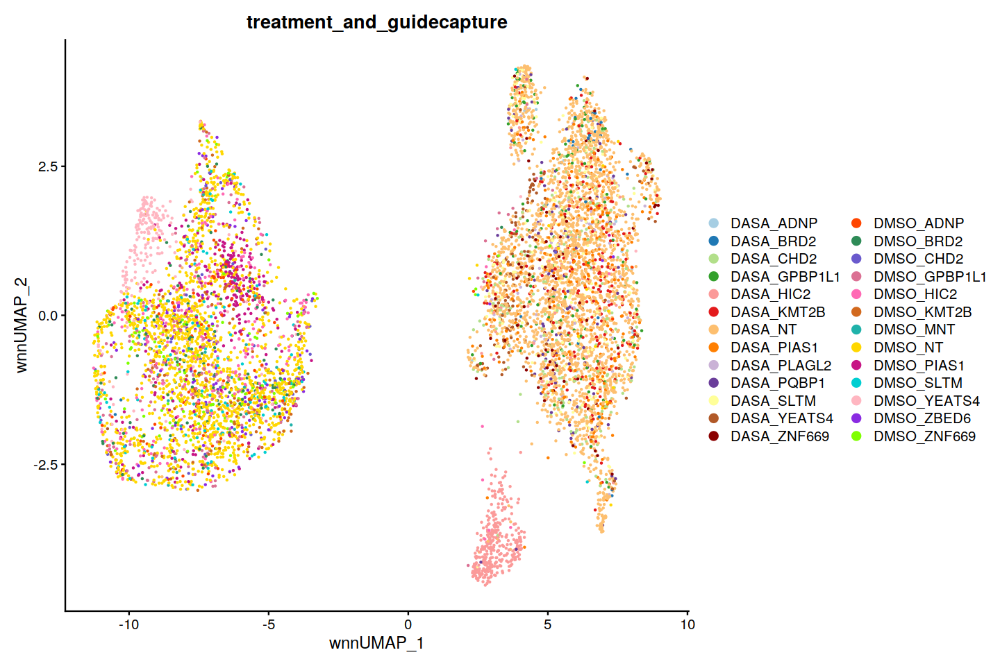

In [77]:
options(repr.plot.width = 12, repr.plot.height = 8)
DimPlot(integrated, reduction = "wnn.umap", group.by = "treatment_and_guidecapture", cols = colors)

In [72]:
# save integrated sobjsaveRDS(integrated, file = '{PATH_11}')

In [ ]:
# stop

In [36]:
# load and convert to h5seuratintegrated <- readRDS('{PATH_11}')# # below runs into some error# SaveH5Seurat(integrated, file = '{PATH_12}')

In [20]:
integrated

An object of class Seurat 
337657 features across 7532 samples within 3 assays 
Active assay: SCT (21958 features, 3000 variable features)
 2 other assays present: ATAC, RNA
 5 dimensional reductions calculated: integrated_lsi, atac.umap, pca, rna.umap, wnn.umap

In [8]:
colnames(integrated@meta.data)

[1] "nCount_ATAC"                        "nFeature_ATAC"                     
 [3] "nCount_RNA"                         "nFeature_RNA"                      
 [5] "nCount_SCT"                         "nFeature_SCT"                      
 [7] "orig.ident"                         "percent.mt"                        
 [9] "nucleosome_signal"                  "nucleosome_percentile"             
[11] "TSS.enrichment"                     "TSS.percentile"                    
[13] "predicted_doublets"                 "doublet_scores"                    
[15] "ATAC_snn_res.0.8"                   "seurat_clusters"                   
[17] "SCT.weight"                         "ATAC.weight"                       
[19] "wsnn_res.0.8"                       "nCount_guidecapture"               
[21] "nFeature_guidecapture"              "guidecapture_maxID"                
[23] "guidecapture_secondID"              "guidecapture_margin"               
[25] "guidecapture_classification"        "guidecapture_classification.global"
[27] "hash.ID"                            "perturb_targets_detected_in_cell"  
[29] "current.ident"                      "S.Score"                           
[31] "G2M.Score"                          "Phase"                             
[33] "old.ident"                          "SCT_snn_res.0.8"                   
[35] "Perturbation"                       "isNT"                              
[37] "mixscape_class"                     "mixscape_class_p_kd"               
[39] "mixscape_class.global"              "sample"                            
[41] "treatment"                          "treatment_and_guidecapture"        
[43] "nCount_PRTB"                        "nFeature_PRTB"

In [15]:
integrated@meta.data[1:6,1:6]

,nCount_ATAC,nFeature_ATAC,nCount_RNA,nFeature_RNA,nCount_SCT,nFeature_SCT
,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>
DASA1_AAACATGCACTATGGC-1,12073,5604,4754,2181,6339,2185
DASA1_AAACATGCACTCAACA-1,17500,7871,7059,3032,7059,3031
DASA1_AAACCGAAGCCTGGTA-1,7583,3497,1460,758,5369,1618
DASA1_AAACCGAAGGACACTT-1,8823,4185,7773,3175,7510,3175
DASA1_AAACCGAAGGCGCTTA-1,15616,7253,6007,2584,6527,2583
DASA1_AAACCGAAGTATTGGC-1,24188,10314,13526,4325,7884,3703


In [12]:
table(integrated$mixscape_class)


  CHD2-1_CHD2-2 KD         CNOT2-2 KD       GPBP1L1-1 KD          HIC2-1 KD 
               281                 30                354                131 
  HIC2-1_HIC2-2 KD          HIC2-2 KD     MNT-1_MNT-2 KD                 NT 
               583                 42                138               4569 
        PIAS1-1 KD PIAS1-1_PIAS1-2 KD        PLAGL2-1 KD          SLTM-1 KD 
                77                667                 84                306 
       YEATS4-1 KD        ZNF669-2 KD 
                55                215 

# Replot WNN UMAP

In [2]:
integrated = readRDS('{PATH_11}')

In [4]:
color_list <- c(
  "#1f77b4",  # Blue
  "#ff7f0e",  # Orange
  "#2ca02c",  # Green
  "#d62728",  # Red
  "#AFEEEE",  # light turquoise
  "#8c564b",  # Brown
  "#e377c2",  # Pink
  "#7f7f7f",  # Gray
  "#bcbd22",  # Yellow
  "#17becf",  # Teal
  "#aec7e8",  # Light Blue
  "#ffbb78",  # Light Orange
  "#98df8a",  # Light Green
  "#ff9896",  # Light Red
  "#c5b0d5",  # Light Purple
  "#c49c94",  # Light Brown
  "#f7b6d2",  # Light Pink
  "#c7c7c7"   # Light Gray
)

In [79]:
options(repr.plot.width = 15, repr.plot.height = 10)
png("07_outputs_ngc/07_integrated_wnn_umap.png", width=5000, height=3000, res=500)
DimPlot(integrated, reduction = "wnn.umap", group.by = "treatment_and_guidecapture", cols = colors)
dev.off()

png 
  2

# Add module scores

Warning message:
“The following features are not present in the object: STAT4, VAV3, FAS, IL1B, HOXA9, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: CD34, EBF3, FCMR, GIMAP2, GIMAP6, GIMAP7, GUCY1A1, MMRN1, TMEM200A, VNN1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: HERC2P3, TXLNGY, RUNX1-IT1, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: CD24, IL2RA, P2RY5, FLJ14213, CD97, CRIP1, C10ORF54, OBFC2A, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: ADGRG6, ARMCX2, BCL11A, C3orf14, CCL19, CD200, CH25H, CXCL1, CXCL11, CXCL3, CXCL6, ENPP4, FAM30A, GUCY1A1, H1-0, H2AC6, H2BC21, HLA-DPA1, HLA-DQA1, HLA-DQB1, HLA-DRB4, IL1B, INHBA, MPZL2, PMCH, PTGER4, SELL, TCEAL2, TM4SF1, VNN1, not searching for symbol synonyms”
Warning message:
“The following features 

[1] "nCount_ATAC"                 "nFeature_ATAC"              
 [3] "nCount_RNA"                  "nFeature_RNA"               
 [5] "orig.ident"                  "percent.mt"                 
 [7] "nucleosome_signal"           "nucleosome_percentile"      
 [9] "TSS.enrichment"              "TSS.percentile"             
[11] "nCount_SCT"                  "nFeature_SCT"               
[13] "predicted_doublets"          "doublet_scores"             
[15] "ATAC_snn_res.0.8"            "seurat_clusters"            
[17] "SCT.weight"                  "ATAC.weight"                
[19] "wsnn_res.0.8"                "guidecapture_classification"
[21] "S.Score"                     "G2M.Score"                  
[23] "Phase"                       "old.ident"                  
[25] "SCT_snn_res.0.8"             "Perturbation"               
[27] "isNT"                        "mixscape_class"             
[29] "mixscape_class_p_kd"         "mixscape_class.global"      
[31] "sample"                      "treatment"                  
[33] "treatment_and_guidecapture"  "nCount_PRTB"                
[35] "nFeature_PRTB"               "Blast_crisis_genes1"        
[37] "Erythroid_differentiation1"  "Chronic_phase_markers1"     
[39] "AML_LSC_markers1"            "Aggresive_CML_UP1"          
[41] "Blast_crisis_set21"          "CML_LSC_Markers1"           
[43] "CML_LSC_Markers21"

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


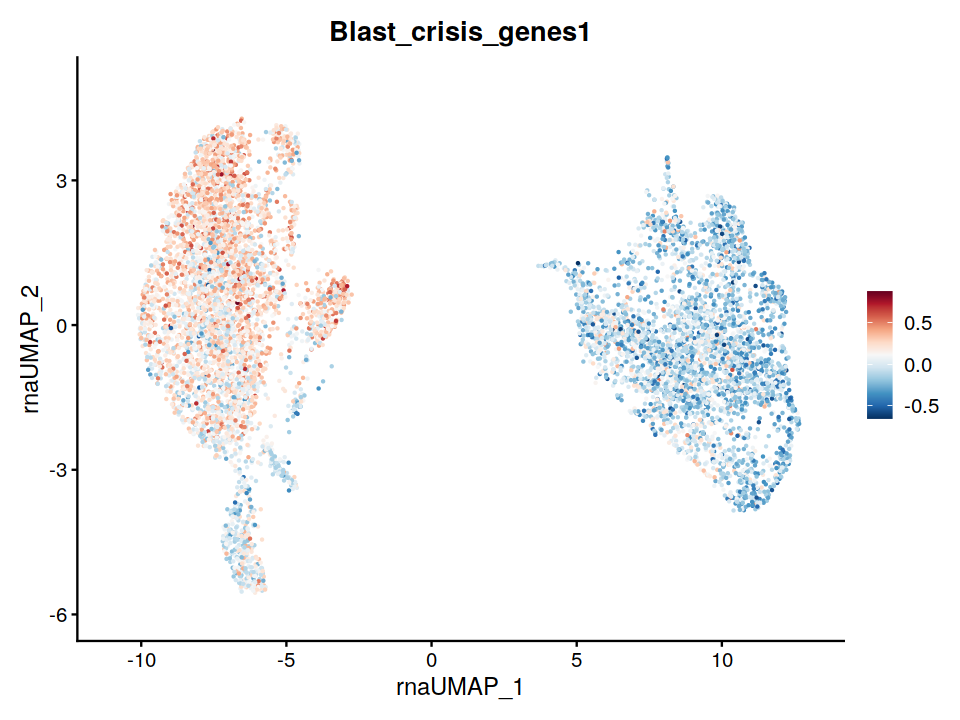

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


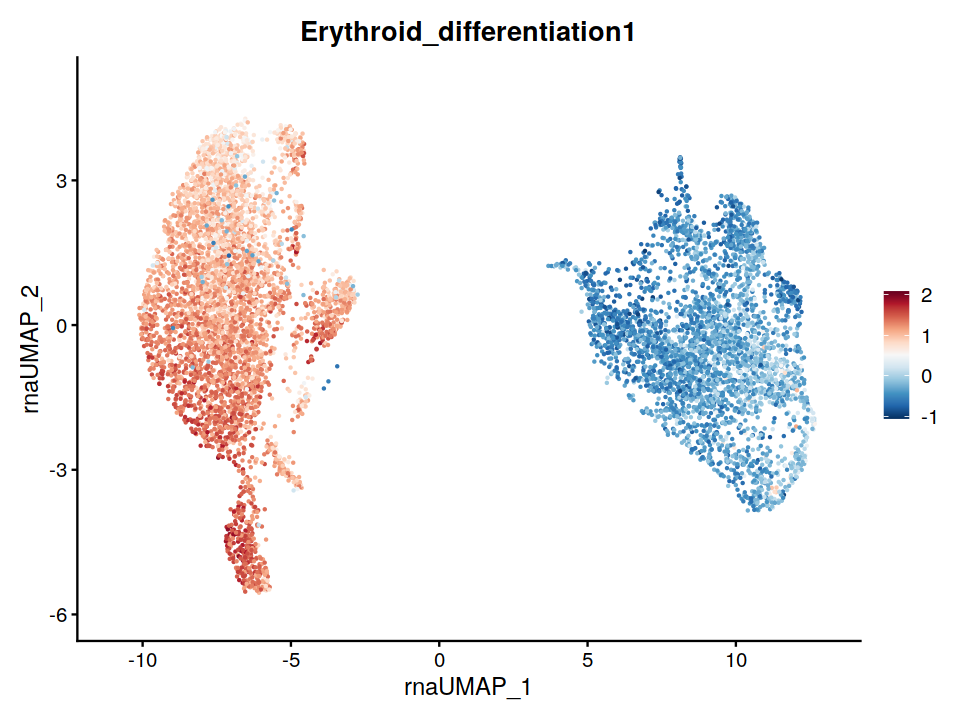

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


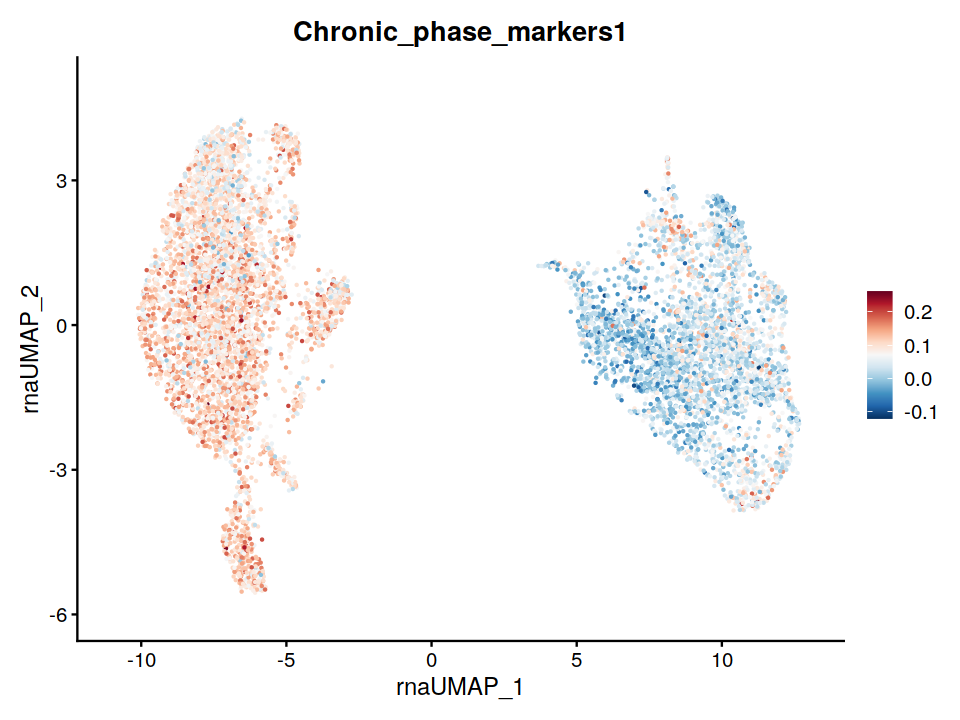

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


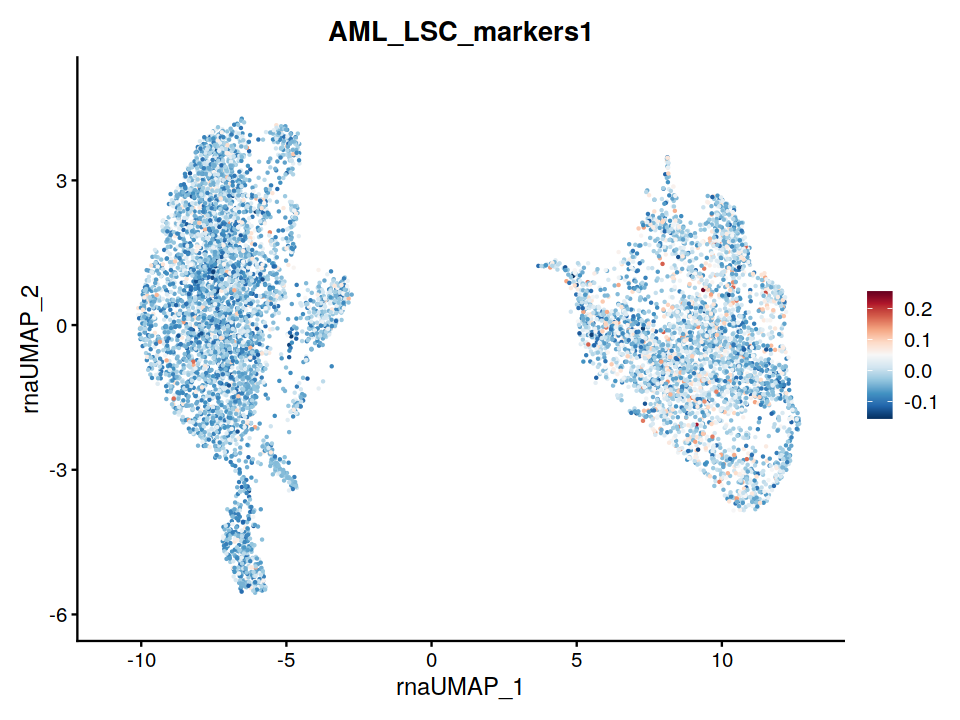

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


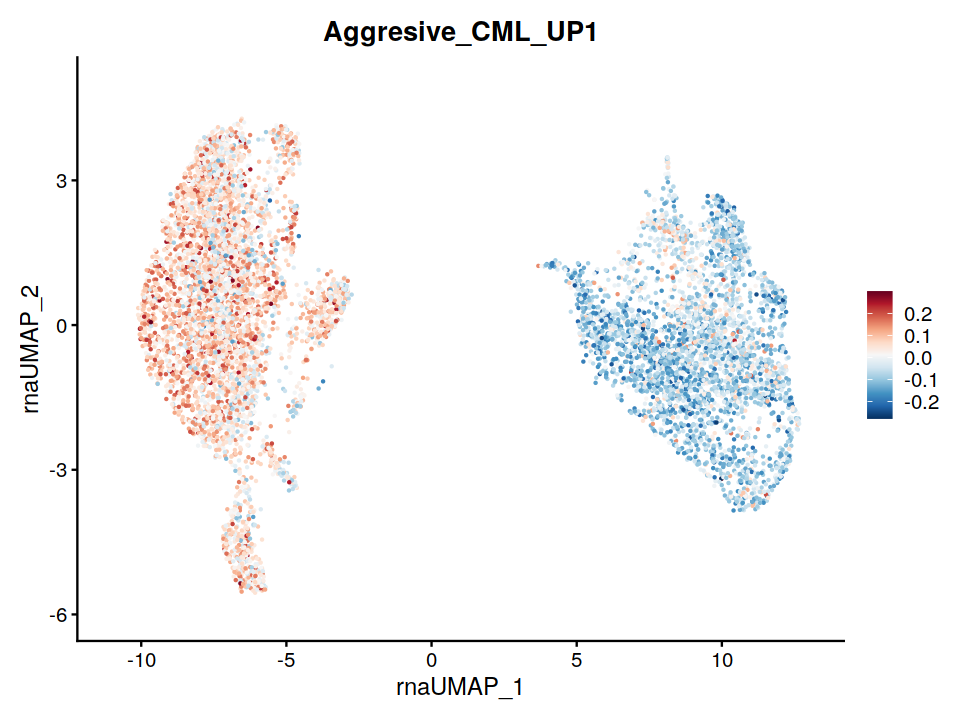

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


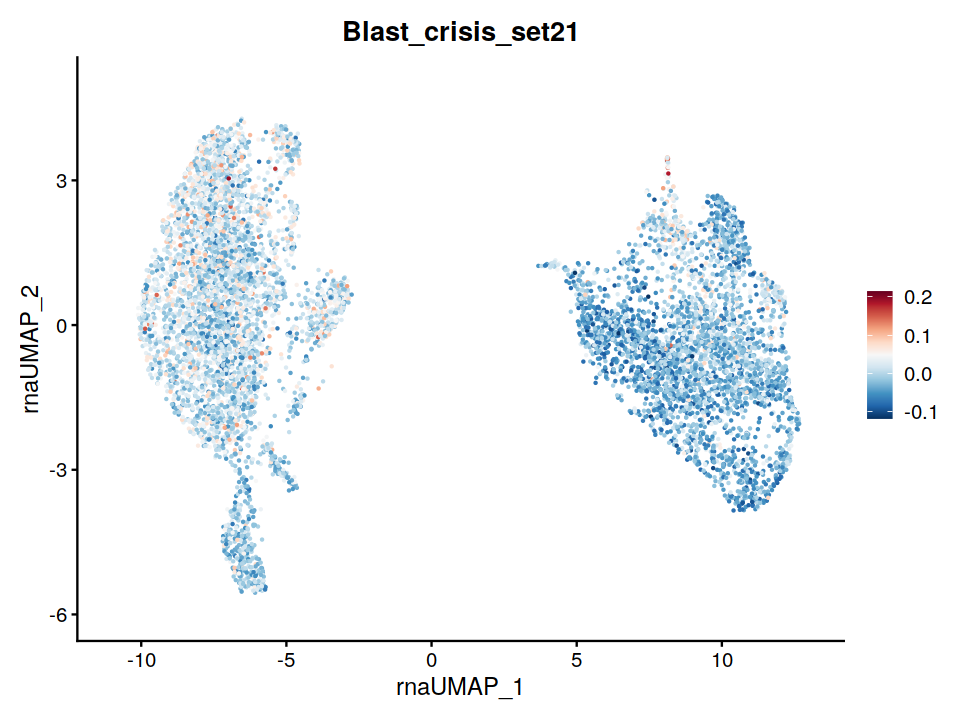

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


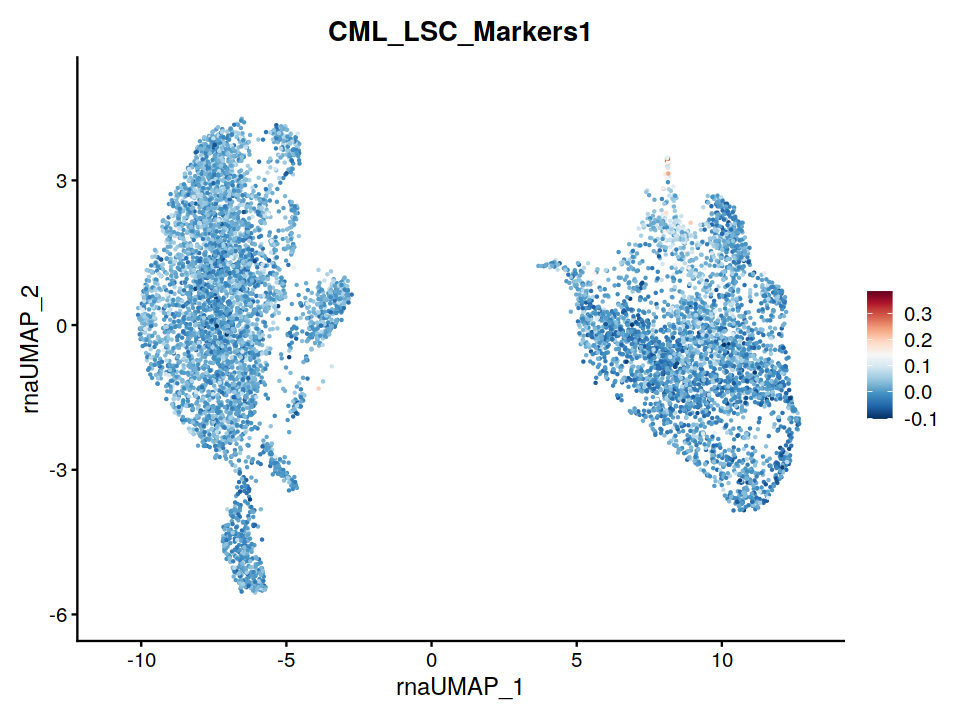

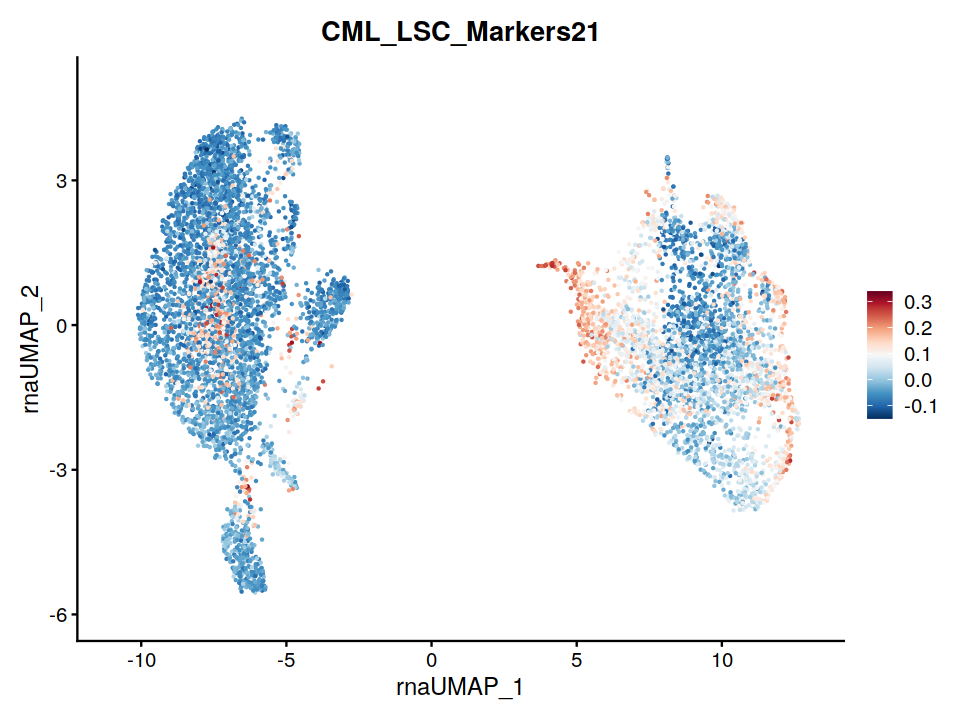

In [80]:
Blast_crisis_genes <- list(c("TANC2", "TCF4", "ALOX12", "SMAD1", "SOCS2"))
Erythroid_differentiation_genes <- list(c("HBG2", "HBG1", "APOE", "BLVRB", "ALAS2", "HBA1", "GYPA", "GYPE", "FAM210B"))
Chronic_phase_genes <- list(c("GYPB", "CTSL", "AKT1",	"BCL2L1",	"CRKL",	"G3BP2",	"GRB2",	"HNRNPK",	"KRAS",	"LYN",	"MAP2K1",	"MAP4K5",	"MAPK1",	"MYC",	"NFKB1",	"NRAS",	"PIK3C3",	"PIK3CA",	"PIK3CB",	"RAC1",	"RAC2",	"STAT3",	"STAT4",	"STAT5A",	"VAV3",	"CASP3",	"CASP6",	"CASP10",	"CCNG1",	"CCNH",	"CDC16", "CDC23",	"CDC27",	"CDC37",	"CDK2",	"CDK7",	"CDK8",	"CDK2AP1",	"FAS",	"MCM3",	"ORC2",	"ORC4",	"ORC5",	"POLE2",	"POLE3",	"TFDP1",	"CDH1",	"CTNNA1",	"FLNA",	"ICAM4",	"ITGAE",	"ITGA2B",	"PARVB",	"TEK",	"TLN1",	"VCL",	"CSF1",	"CSF2RB",	"IL1B",	"IL7",	"NET1",	"SMAD2",	"SMAD4",	"TGFB1",	"ALDH1A1",	"GATA2",	"HOXA10",	"HOXA9",	"LMO2",	"MEIS1",	"PBX3",	"BMI1",	"TAL1",	"IKZF1",	"EPOR",	"GATA1",	"HBB",	"HBD",	"HBG1",	"HBG2",	"KLF1",	"TFR2",	"ACSL1",	"ACSL4",	"ACSL5",	"FASN",	"HADHA",	"CD36",	"F2R",	"FCGR2A",	"ADGRG1",	"LEPR",	"P2RX5",	"DLC1",	"SRI",	"TIMP1"))
Leukemia_StemCell_Markers_AML <- list(c("ABCC2",	"BIRC3",	"CD34",	"EBF3",	"EFCC1",	"EVI2A",	"FBXO21",	"FCMR",	"GIMAP2",	"GIMAP6",	"GIMAP7",	"GSAP",	"GUCY1A1",	"HECA",	"HLF",	"HOPX",	"ICAM1",	"LGALSL",	"LTB",	"MEF2C",	"MMRN1",	"PCDHGA10",	"RBPMS",	"SETBP1",	"SH3BP5",	"SLC37A3",	"SLC38A1",	"TMEM200A",	"VNN1"))
Aggresive_CML_UP <- list(c("CD7",	"HIST1H3D",	"HTR1F",	"SOX18",	"MYO15B",	"HIST1H4E",	"HSPA6",	"ICAM5",	"HERC2P3",	"HIST1H2BG",	"TXLNGY",	"TPM2",	"BAMBI",	"RUNX1-IT1",	"NEAT1",	"COL18A1",	"SEC31B",	"DDAH1",	"ATP8B1",	"TENT2",	"ITGAM",	"HIST1H2AC",	"AK1",	"HIST2H2BE",	"HOXA1"))
Blast_crisis_set2 <- list(c("CD24",	"LTB",	"EMP1",	"ALOX5",	"IL2RA",	"SH3TC1",	"P2RY5",	"FLJ14213",	"ISG20",	"CRIP2",	"CD52",	"CLECL1",	"S100Z",	"CD97",	"GBP2",	"TLE4",	"FLT3",	"MYO5C",	"CLEC2B",	"TNFRSF1B",	"STX3",	"ZNF467",	"SHANK3",	"IL13RA1",	"DUSP6",	"ANTXR2",	"TRIM22",	"CBL",	"CRIP1",	"AHNAK",	"DSE",	"MMP28",	"LY86",	"XYLT1",	"SVIL",	"CD9",	"RHOC",	"C10ORF54",	"OBFC2A",	"AIF1L",	"GPR162",	"TIMP2",	"CD96",	"MN1"))
CML_LSC_Markers <- list(c("ADAM28",	"ADAM8",	"ADGRG6",	"AKR1C3",	"ALOX5",	"ANXA5",	"AREG",	"ARMCX2",	"BAALC",	"BCL11A",	"BIRC3",	"C3orf14",	"CCL19",	"CCNG2",	"CD200",	"CD40",	"CD44",	"CD59",	"CH25H",	"CLEC2B",	"CREM",	"CRHBP",	"CTSO",	"CXCL1",	"CXCL11",	"CXCL13",	"CXCL2",	"CXCL3",	"CXCL6",	"CXCL8",	"CYTIP",	"DMD",	"DUSP6",	"EMP1",	"ENPP4",	"ERG",	"EVI2A",	"FAM30A",	"FNBP1",	"GABPB1-IT1",	"GBP2",	"GLIPR1",	"GUCY1A1",	"H1-0",	"H2AC6",	"H2BC21",	"HCP5",	"HLA-DPA1",	"HLA-DQA1",	"HLA-DQB1",	"HLA-DRB4",	"HLF",	"HLX",	"IDS",	"IFI16",	"IL18R1",	"IL1B",	"INHBA",	"LIMCH1",	"MIR22HG",	"MLLT3",	"MPZL2",	"MYO5C",	"NEAT1",	"NFAT5",	"NRIP1",	"OPTN",	"PCDH9",	"PMCH",	"PPFIBP1",	"PTGER4",	"PTPRC",	"RABGAP1",	"RBPMS",	"RPL31",	"SELL",	"SH3BP5",	"SOD2",	"SORL1",	"SPTBN1",	"SVIL",	"TCEAL2",	"TCF4",	"TCF7L2",	"TFPI",	"TGFB1I1",	"TM4SF1",	"TNFSF10",	"TNFSF4",	"TPBG",	"TRIM22",	"TSPAN31",	"TSPAN6",	"VNN1"))
CML_LSC_Markers2 <- list(c("ABCC4",	"ABCD3",	"ACOT7",	"ACTN1",	"AMMECR1",	"APOBEC3B",	"AQP3",	"ARHGAP19",	"ASPM",	"ATP5MC3",	"AURKA",	"AURKB",	"BIRC5",	"BRCA1",	"BUB1",	"BUB1B",	"CCL2",	"CCNA2",	"CCNB1",	"CCNB2",	"CCNE1",	"CCNE2",	"CD36",	"CDC20",	"CDC45",	"CDC6",	"CDC7",	"CDK1",	"CDKN3",	"CENPA",	"CENPF",	"CENPM",	"CENPU",	"CEP55",	"CEP76",	"CHEK1",	"CKS1B",	"CLC",	"CLEC11A",	"COTL1",	"CPA3",	"CPOX",	"CSE1L",	"CST7",	"CSTA",	"DHFR",	"DLC1",	"DLGAP5",	"DNAJC12",	"DSCC1",	"DUT",	"E2F8",	"ECT2",	"EIF1AX",	"ELOVL6",	"ELP5",	"ESPL1",	"EZH2",	"FABP5",	"FANCI",	"FBXO5",	"FEN1",	"GGH",	"GINS1",	"GINS2",	"GMNN",	"GSPT1",	"H1-2",	"H2AX",	"HAT1",	"HBB",	"HBD",	"HBG1",	"HDC",	"HGF",	"HMMR",	"HPGDS",	"HSPA14",	"IDH2",	"ITGA2B",	"ITGB3BP",	"KIF11",	"KIF15",	"KIF18B",	"KIF20A",	"KIF2C",	"KIF4A",	"KLF1",	"KLHL7",	"KPNA2",	"LAT",	"LEPR",	"LMNA",	"LRRC59",	"LSM5",	"MAD2L1",	"MCM10",	"MCM2",	"MCM4",	"MCM5",	"MELK",	"MICAL2",	"MINPP1",	"MPO",	"MRPS15",	"MRPS28",	"MS4A3",	"NCAPG",	"NDC80",	"NEK2",	"NPM3",	"NT5DC2",	"NUDT1",	"NUDT4",	"NUP85",	"NUSAP1",	"OIP5",	"PALM2AKAP2",	"PBK",	"PCLAF",	"PDLIM1",	"PDSS1",	"PF4",	"PIEZO2",	"PMP22",	"POLE2",	"PPBP",	"PPIF",	"PRC1",	"PRDX2",	"PRDX4",	"PRG2",	"PRKAR2B",	"PROS1",	"RAB31",	"RACGAP1",	"RAD51",	"RAD51AP1",	"RANBP1",	"RFC3",	"RFC4",	"RHAG",	"RMDN1",	"RNASE2",	"RNASEH2A",	"RPA3",	"RRM1",	"RRM2",	"SAC3D1",	"SAMM50",	"SERPINB2",	"SFXN1",	"SHMT2",	"SLC25A13",	"SLC7A5",	"SMC2",	"SNRNP25",	"SNRPD1",	"SORD",	"SPAG5",	"SPC25",	"STK39",	"STMN1",	"SUB1",	"SUCLA2",	"SYNCRIP",	"TFR2",	"TK1",	"TOP2A",	"TPM1",	"TPSAB1",	"TPX2",	"TRIP13",	"TST",	"TTK",	"TUBB6",	"TYMS",	"UBE2C",	"UBE2S",	"VRK1",	"XIST",	"XK",	"ZNF593",	"ZWINT"))

LeukemiaStemCell_Markers_CML <- list(c("PTH2R", "CD33", "ALOX5", "PPP2CA", ""))

#CD33 reference https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3269481/
options(repr.plot.width = 8, repr.plot.height = 6)

integrated <- AddModuleScore(object = integrated, features = Blast_crisis_genes, name = "Blast_crisis_genes")
integrated <- AddModuleScore(object = integrated, features = Erythroid_differentiation_genes, name = "Erythroid_differentiation")
integrated <- AddModuleScore(object = integrated, features = Chronic_phase_genes, name = "Chronic_phase_markers")
integrated <- AddModuleScore(object = integrated, features = Leukemia_StemCell_Markers_AML, name = "AML_LSC_markers")
integrated <- AddModuleScore(object = integrated, features = Aggresive_CML_UP, name = "Aggresive_CML_UP")
integrated <- AddModuleScore(object = integrated, features = Blast_crisis_set2, name = "Blast_crisis_set2")
integrated <- AddModuleScore(object = integrated, features = CML_LSC_Markers, name = "CML_LSC_Markers")
integrated <- AddModuleScore(object = integrated, features = CML_LSC_Markers2, name = "CML_LSC_Markers2")

names(x=integrated[[]])
FeaturePlot(object = integrated, features = "Blast_crisis_genes1") + scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))
FeaturePlot(object = integrated, features = "Erythroid_differentiation1") + scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))
FeaturePlot(object = integrated, features = "Chronic_phase_markers1") + scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))
FeaturePlot(object = integrated, features = "AML_LSC_markers1") + scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))
FeaturePlot(object = integrated, features = "Aggresive_CML_UP1") + scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))
FeaturePlot(object = integrated, features = "Blast_crisis_set21") + scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))
FeaturePlot(object = integrated, features = "CML_LSC_Markers1") + scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))
FeaturePlot(object = integrated, features = "CML_LSC_Markers21") + scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

In [ ]:
## stop

## SAVE RNA

In [37]:
DefaultAssay(integrated) <- "RNA"

In [38]:
integrated <- DietSeurat(
  integrated,
  counts = TRUE,
  data = TRUE,
  scale.data = FALSE,
  features = NULL,
  assays = NULL,
  dimreducs = NULL,
  graphs = NULL,
  misc = TRUE
)

In [39]:
integrated[["ATAC"]] <- NULL
integrated[["SCT"]] <- NULL
integrated[["guidecapture"]] <- NULL
integrated[["PRTB"]] <- NULL
integrated

An object of class Seurat 
36601 features across 7532 samples within 1 assay 
Active assay: RNA (36601 features, 0 variable features)

In [41]:
SaveH5Seurat(integrated, file = "07_outputs_ngc/07_objects/h5Seurat/07_integrated_rna_only_sobj.h5Seurat", overwrite = T)
Convert("07_outputs_ngc/07_objects/h5Seurat/07_integrated_rna_only_sobj.h5Seurat", dest = "h5ad", overwrite = T)

Warning message:
“Overwriting previous file 07_outputs/07_objects/h5Seurat/07_integrated_rna_only_sobj.h5Seurat”
Creating h5Seurat file for version 3.1.5.9900

Adding counts for RNA

Adding data for RNA

No variable features found for RNA

No feature-level metadata found for RNA

Validating h5Seurat file

Adding data from RNA as X

Adding counts from RNA as raw

Transfering meta.data to obs



## SAVE ATAC

In [42]:
# reload integratedintegrated <- readRDS('{PATH_11}')

In [43]:
DefaultAssay(integrated) <- "ATAC"

In [44]:
integrated <- DietSeurat(
  integrated,
  counts = TRUE,
  data = TRUE,
  scale.data = FALSE,
  features = NULL,
  assays = NULL,
  dimreducs = NULL,
  graphs = NULL,
  misc = TRUE
)

In [45]:
integrated[["RNA"]] <- NULL
integrated[["SCT"]] <- NULL
integrated[["guidecapture"]] <- NULL
integrated[["PRTB"]] <- NULL
integrated

An object of class Seurat 
279098 features across 7532 samples within 1 assay 
Active assay: ATAC (279098 features, 0 variable features)

In [47]:
SaveH5Seurat(integrated, file = "07_outputs_ngc/07_objects/h5Seurat/07_integrated_atac_only_sobj.h5Seurat", overwrite = T)
Convert("07_outputs_ngc/07_objects/h5Seurat/07_integrated_atac_only_sobj.h5Seurat", dest = "h5ad", overwrite = T)

Warning message:
“Overwriting previous file 07_outputs/07_objects/h5Seurat/07_integrated_atac_only_sobj.h5Seurat”
Creating h5Seurat file for version 3.1.5.9900

Adding counts for ATAC

Adding data for ATAC

No variable features found for ATAC

Adding feature-level metadata for ATAC

Writing out ranges for ATAC

Writing out motifs for ATAC

Writing out fragments for ATAC



ERROR: Error in hgroup$create_group(name = name): HDF5-API Errors:
    error #000: ../../../src/H5G.c in H5Gcreate2(): line 323: unable to create group
        class: HDF5
        major: Symbol table
        minor: Unable to initialize object

    error #001: ../../../src/H5Gint.c in H5G__create_named(): line 157: unable to create and link to group
        class: HDF5
        major: Symbol table
        minor: Unable to initialize object

    error #002: ../../../src/H5L.c in H5L_link_object(): line 1572: unable to create new link to object
        class: HDF5
        major: Links
        minor: Unable to initialize object

    error #003: ../../../src/H5L.c in H5L__create_real(): line 1813: can't insert link
        class: HDF5
        major: Links
        minor: Unable to insert object

    error #004: ../../../src/H5Gtraverse.c in H5G_traverse(): line 851: internal path traversal failed
        class: HDF5
        major: Symbol table
        minor: Object not found

    error #005: ../../../src/H5Gtraverse.c in H5G__traverse_real(


In [50]:
integrated

An object of class Seurat 
279098 features across 7532 samples within 1 assay 
Active assay: ATAC (279098 features, 0 variable features)

In [53]:
MuDataSeurat::WriteH5AD(integrated, "07_outputs_ngc/07_objects/h5Seurat/07_integrated_atac_only_sobj.h5ad", assay="ATAC")

[1] TRUE

In [9]:
# try saving everything togetherlibrary(MuDataSeurat)# reload integratedintegrated <- readRDS('{PATH_11}')DefaultAssay(integrated) <- "RNA"integrated <- DietSeurat(  integrated,  counts = TRUE,  data = TRUE,  scale.data = FALSE,  features = NULL,  assays = NULL,  dimreducs = NULL,  graphs = NULL,  misc = TRUE)integrated[["SCT"]] <- NULLintegrated[["guidecapture"]] <- NULLintegrated[["PRTB"]] <- NULL# saveWriteH5MU(integrated, "07_outputs_ngc/07_objects/h5Seurat/07_integrated_sobj.h5mu")

[1] TRUE

In [10]:
test <- ReadH5MU( "07_outputs_ngc/07_objects/h5Seurat/07_integrated_sobj.h5mu")

In [11]:
integrated

An object of class Seurat 
315699 features across 7532 samples within 2 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: ATAC

In [14]:
DefaultAssay(integrated) <- "ATAC"
Fragments(integrated)

$index1
A Fragment object for 2274 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 2365 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 1240 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 0 cells

$index1
A Fragment object for 1653 cells


In [4]:
DefaultAssay(integrated) <- "ATAC"

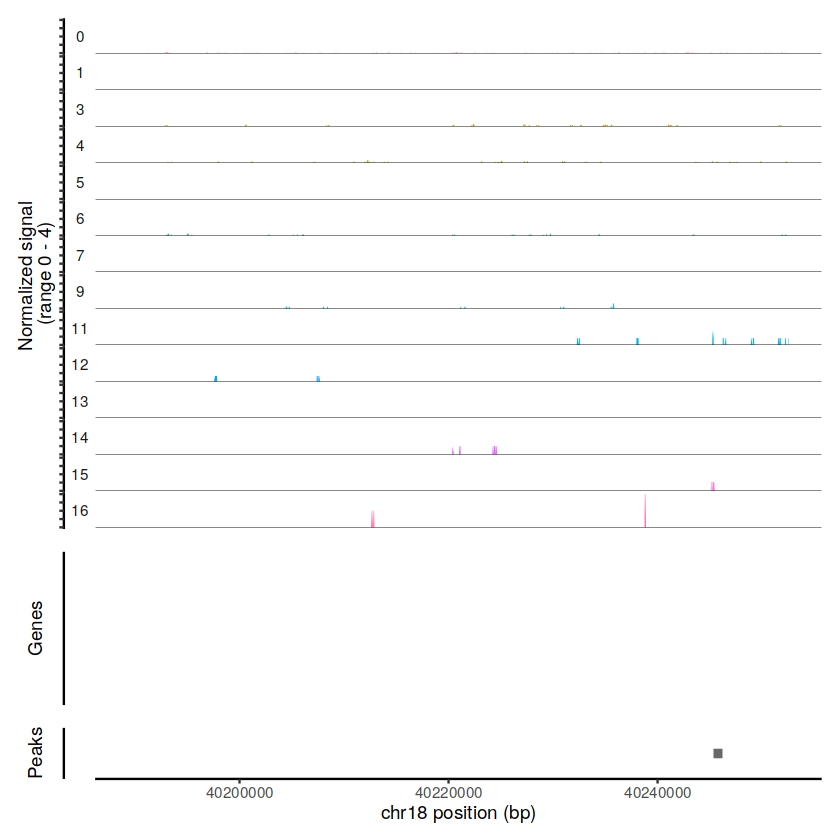

In [5]:
CoveragePlot(subset(integrated, subset = treatment_and_guidecapture == "DASA_HIC2" | treatment_and_guidecapture == "DASA_NT"), 
    region = "chr18-40189344-40252549")